# Video Transcription and Annotation

## Setup

In [1]:
import os
import glob
import pandas as pd
import numpy as np

#from moviepy.editor import *
#import moviepy.editor as mp
from moviepy.editor import VideoFileClip

import whisper

### Set Directories

In [2]:
proj_dir = '/Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/'
#proj_dir = '/Users/haroonpopal/hpopal@umd.edu - Google Drive/My Drive/dscn_lab/projects/net/'
data_dir = proj_dir+'derivatives/task-naturalistic/stimuli/'
outp_dir = proj_dir+'derivatives/reverse_correlation/'

audio_dir = proj_dir + 'derivatives/video_analysis/audio_files/subclips/'

os.chdir(proj_dir)

In [3]:
cb_atlas_labels = pd.read_csv(proj_dir+'derivatives/rois/Nettekoven_2023/atl-NettekovenAsym32.lut', sep=' ',
                             names=['Value', 'R', 'G', 'B', 'Label'])

cb_roi_names = cb_atlas_labels['Label'][1:].to_list()
cb_roi_names.sort()

In [4]:
video_timings = pd.read_csv(data_dir+'video_timing.csv')
video_timings.head()

,Run,Video,Onset
0,1,grapes_hd,13.750
1,1,wedding_hd,146.149
2,1,awkward_hd,367.617
3,2,ballet_hd,13.750
4,2,penguin_hd,211.556


In [5]:
roi_data = {}
for temp_roi in cb_roi_names:
    roi_data[temp_roi] = pd.read_csv(outp_dir+'group_results/'+temp_roi+'_ts_stats.csv', index_col=0)

roi_data[temp_roi].head()

,mean,t,p,p_fdr,sig_tw,Run
0,0.018043,0.248951,0.804278,0.918780,0.0,1
1,-0.537945,-2.788447,0.007151,0.091997,0.0,1
2,-0.430145,-2.462975,0.016769,0.151242,0.0,1
3,-0.136402,-0.871830,0.386896,0.643564,0.0,1
4,-0.112738,-0.644115,0.522040,0.737362,0.0,1


In [6]:
from itertools import groupby

def find_time_windows(df_index):
    gb = groupby(enumerate(df_index), key=lambda x: x[0] - x[1])
    
    # Repack elements from each group into list
    all_groups = ([i[1] for i in g] for _, g in gb)
    
    # Filter out one element lists
    return list(filter(lambda x: len(x) > 1, all_groups))

In [7]:
sig_window_stim_info = pd.DataFrame(columns=['ROI','Run','Video','TRs','Time_start','Time_end','Window_length'])
i_row = 0
for temp_roi in cb_roi_names:
    for temp_run in range(1,5):
        temp_run_data = roi_data[temp_roi][roi_data[temp_roi]['Run'] == temp_run]
        temp_run_data['TR'] = range(len(temp_run_data))
        temp_run_data_sig = temp_run_data[temp_run_data['sig_tw'] == 1].copy()
        #temp_run_data_sig_reset = temp_run_data_sig.reset_index(drop=True)
        temp_run_windows = find_time_windows(temp_run_data_sig['TR'])
        
        run_video_stim = video_timings[video_timings['Run'] == temp_run]
        
        
        
        if len(temp_run_windows) > 0:
            for temp_list in temp_run_windows:
                onset_time = temp_list[0] * 1.25
                end_time = temp_list[-1] * 1.25

                if onset_time < 13.75:
                    temp_video = 'fixation'
                else:
                    temp_video_data = run_video_stim[run_video_stim['Onset'] < onset_time].iloc[-1]
                    temp_video = temp_video_data['Video']
                
                sig_window_stim_info.loc[i_row,'ROI'] = temp_roi
                sig_window_stim_info.loc[i_row,'Run'] = temp_run
                sig_window_stim_info.loc[i_row,'Video'] = temp_video
                sig_window_stim_info.loc[i_row,'TRs'] = temp_list
                sig_window_stim_info.loc[i_row,'Time_start'] = onset_time - temp_video_data['Onset']
                sig_window_stim_info.loc[i_row,'Time_end'] = end_time - temp_video_data['Onset']
                sig_window_stim_info.loc[i_row,'Window_length'] = len(temp_list) * 1.25
                i_row += 1

# Sort by video for easier video importing later
sig_window_stim_info = sig_window_stim_info.sort_values(by=['Video'])

sig_window_stim_info.head()


,ROI,Run,Video,TRs,Time_start,Time_end,Window_length
472,D4R,4,afv_hd,"[298, 299, 300, 301]",38.144,41.894,5.0
881,S2R,4,afv_hd,"[298, 299, 300]",38.144,40.644,3.75
602,M1R,4,afv_hd,"[317, 318, 319, 320, 321]",61.894,66.894,6.25
601,M1R,4,afv_hd,"[303, 304, 305]",44.394,46.894,3.75
600,M1R,4,afv_hd,"[298, 299, 300]",38.144,40.644,3.75


<Axes: xlabel='ROI', ylabel='Window_length'>

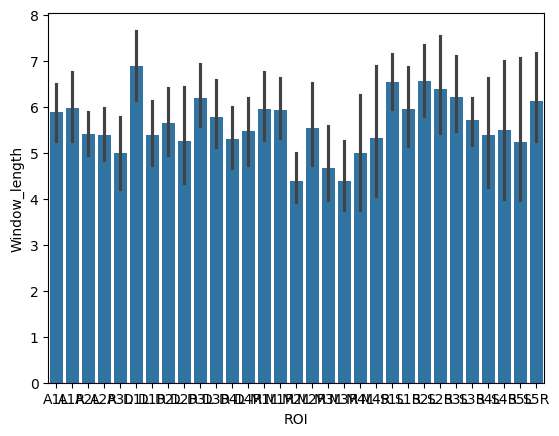

In [8]:
import seaborn as sns

sns.barplot(data=sig_window_stim_info.sort_values(by=['ROI']), x='ROI', y='Window_length')

In [9]:
transcribe_model = whisper.load_model("small")

In [10]:
if os.path.exists(outp_dir+'sig_window_text.csv'):
    sig_window_stim_info = pd.read_csv(outp_dir+'sig_window_text.csv', index_col=0)
else:
    prev_clip_name = sig_window_stim_info.loc[0, 'Video']
    video_raw = VideoFileClip(data_dir+prev_clip_name+'.avi')
    
    for i_row in sig_window_stim_info.index:
        clip_name=sig_window_stim_info.loc[i_row, 'Video']
        clip_start=round(sig_window_stim_info.loc[i_row, 'Time_start'], 2)
        clip_end=round(sig_window_stim_info.loc[i_row, 'Time_end'], 2)
    
        audio_path = audio_dir + clip_name+'_'+str(clip_start)+'-'+str(clip_end)+'.wav'
        if not os.path.isfile(audio_path):
        
            if clip_name == 'fixation':
                continue
    
            video_raw = VideoFileClip(data_dir+clip_name+'.avi')
            
            if clip_start > video_raw.duration:
                continue
            
            # Because of TRs, clip_end may be longer than the video duration
            # account for this by just taking the duration
            if clip_end > video_raw.duration:
                clip_end = np.floor(video_raw.duration)
        
            if clip_start > clip_end:
                continue
            
            video_clip = video_raw.subclipped(clip_start, clip_end)
        
            audio_clip = video_clip.audio
            audio_path = audio_dir + clip_name+'_'+str(clip_start)+'-'+str(clip_end)+'.wav'
            audio_clip.write_audiofile(audio_path, codec='pcm_s16le')
    
        # Transcribe
        result = transcribe_model.transcribe(audio_path, fp16=False)
        sig_window_stim_info.loc[i_row, 'Text'] = result['text']
    
    sig_window_stim_info.to_csv(outp_dir+'sig_window_text.csv')

In [11]:
sig_window_stim_info.head()

,ROI,Run,Video,TRs,Time_start,Time_end,Window_length,Text
455,S1L,4,afv_hd,"[287, 288, 289]",24.394,26.894,3.75,And the turkey...
54,M1L,4,afv_hd,"[270, 271, 272]",3.144,5.644,3.75,Stepping on gardening tools versus turkeys.
984,S3R,4,afv_hd,"[303, 304, 305, 306, 307]",44.394,49.394,6.25,I'm served! AAH! Is it enough?
985,S3R,4,afv_hd,"[310, 311, 312]",53.144,55.644,3.75,Guys stepping on gardening to
459,S1L,4,afv_hd,"[324, 325, 326, 327, 328]",70.644,75.644,6.25,versus.


In [12]:
sig_window_stim_info['Text'] = sig_window_stim_info['Text'].fillna('')

sig_window_stim_info.head()

,ROI,Run,Video,TRs,Time_start,Time_end,Window_length,Text
455,S1L,4,afv_hd,"[287, 288, 289]",24.394,26.894,3.75,And the turkey...
54,M1L,4,afv_hd,"[270, 271, 272]",3.144,5.644,3.75,Stepping on gardening tools versus turkeys.
984,S3R,4,afv_hd,"[303, 304, 305, 306, 307]",44.394,49.394,6.25,I'm served! AAH! Is it enough?
985,S3R,4,afv_hd,"[310, 311, 312]",53.144,55.644,3.75,Guys stepping on gardening to
459,S1L,4,afv_hd,"[324, 325, 326, 327, 328]",70.644,75.644,6.25,versus.


In [13]:
sig_window_stim_info[sig_window_stim_info['ROI'] == 'S1R']

,ROI,Run,Video,TRs,Time_start,Time_end,Window_length,Text
906,S1R,4,afv_hd,"[298, 299, 300]",38.144,40.644,3.75,
907,S1R,4,afv_hd,"[303, 304, 305]",44.394,46.894,3.75,I'm served!
908,S1R,4,afv_hd,"[317, 318, 319, 320, 321]",61.894,66.894,6.25,with milk mustaches. Oh my goodness.
869,S1R,1,awkward_hd,"[345, 346, 347, 348]",63.633,67.383,5.00,"It didn't work, and I knew from experience th..."
871,S1R,1,awkward_hd,"[388, 389, 390]",117.383,119.883,3.75,You need to move it. You cannot touch my tray...
870,S1R,1,awkward_hd,"[378, 379, 380]",104.883,107.383,3.75,out of little cups on a tray. That's how I li...
872,S1R,2,ballet_hd,"[69, 70, 71, 72, 73]",72.500,77.500,6.25,She went on to become one of the few women of...
873,S1R,2,ballet_hd,"[109, 110, 111]",122.500,125.000,3.75,come back here and sort of...
874,S1R,2,ballet_hd,"[132, 133, 134, 135, 136, 137, 138]",151.250,158.750,8.75,just started doing some ballet class. And tha...
875,S1R,2,ballet_hd,"[165, 166, 167, 168, 169, 170, 171]",192.500,200.000,8.75,you


In [14]:
sig_window_stim_info[sig_window_stim_info['ROI'] == 'S3R']

,ROI,Run,Video,TRs,Time_start,Time_end,Window_length,Text
984,S3R,4,afv_hd,"[303, 304, 305, 306, 307]",44.394,49.394,6.25,I'm served! AAH! Is it enough?
985,S3R,4,afv_hd,"[310, 311, 312]",53.144,55.644,3.75,Guys stepping on gardening to
983,S3R,4,afv_hd,"[298, 299, 300]",38.144,40.644,3.75,
954,S3R,1,awkward_hd,"[411, 412, 413, 414]",146.133,149.883,5.00,my solution. I was going to create a fake rea...
953,S3R,1,awkward_hd,"[388, 389, 390, 391]",117.383,121.133,5.00,You need to move this. You cannot touch my tr...
952,S3R,1,awkward_hd,"[379, 380, 381, 382]",106.133,109.883,5.00,That's how I like to drink my smoothie.
956,S3R,2,ballet_hd,"[67, 68, 69, 70, 71]",70.000,75.000,6.25,that pushed her to pursue a career in ballet....
957,S3R,2,ballet_hd,"[136, 137, 138, 139, 140]",156.250,161.250,6.25,this and it began morphine and changing and t...
969,S3R,3,basketball_hd,"[149, 150, 151, 152, 153, 154]",172.500,178.750,7.50,"It's right at 80, 38 seconds ago. The final s..."
987,S3R,4,cleese_hd,"[343, 344, 345]",20.489,22.989,3.75,I'm the manager! What? I'm...


## Pose Estimation

In [71]:
sig_window_stim_info = pd.read_csv(outp_dir+'sig_window_text.csv', index_col=0)
sig_window_stim_info.head()

,ROI,Run,Video,TRs,Time_start,Time_end,Window_length,Text
455,S1L,4,afv_hd,"[287, 288, 289]",24.394,26.894,3.75,And the turkey...
54,M1L,4,afv_hd,"[270, 271, 272]",3.144,5.644,3.75,Stepping on gardening tools versus turkeys.
984,S3R,4,afv_hd,"[303, 304, 305, 306, 307]",44.394,49.394,6.25,I'm served! AAH! Is it enough?
985,S3R,4,afv_hd,"[310, 311, 312]",53.144,55.644,3.75,Guys stepping on gardening to
459,S1L,4,afv_hd,"[324, 325, 326, 327, 328]",70.644,75.644,6.25,versus.


In [74]:
subclip_dir = proj_dir + 'derivatives/video_analysis/video_clips/'

for i_row in sig_window_stim_info.index:
    clip_name=sig_window_stim_info.loc[i_row, 'Video']
    clip_start=round(sig_window_stim_info.loc[i_row, 'Time_start'], 2)
    clip_end=round(sig_window_stim_info.loc[i_row, 'Time_end'], 2)
    
    subclip_path = subclip_dir + clip_name+'_'+str(clip_start)+'-'+str(clip_end)+'.mp4'
    if not os.path.isfile(subclip_path):
        
        if clip_name == 'fixation':
            continue
    
        video_raw = VideoFileClip(data_dir+clip_name+'.avi')
            
        if clip_start > video_raw.duration:
            continue
            
        # Because of TRs, clip_end may be longer than the video duration
        # account for this by just taking the duration
        if clip_end > video_raw.duration:
            clip_end = np.floor(video_raw.duration)
        
        if clip_start > clip_end:
            continue
            
        video_clip = video_raw.subclip(clip_start, clip_end)
        
        video_clip.write_videofile(subclip_path)


Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_24.39-26.89.mp4.
MoviePy - Writing audio in afv_hd_24.39-26.89TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_24.39-26.89.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_24.39-26.89.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_3.14-5.64.mp4.
MoviePy - Writing audio in afv_hd_3.14-5.64TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_3.14-5.64.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_3.14-5.64.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_44.39-49.39.mp4.
MoviePy - Writing audio in afv_hd_44.39-49.39TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_44.39-49.39.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_44.39-49.39.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_53.14-55.64.mp4.
MoviePy - Writing audio in afv_hd_53.14-55.64TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_53.14-55.64.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_53.14-55.64.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_70.64-75.64.mp4.
MoviePy - Writing audio in afv_hd_70.64-75.64TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_70.64-75.64.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_70.64-75.64.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_63.14-66.89.mp4.
MoviePy - Writing audio in afv_hd_63.14-66.89TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_63.14-66.89.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_63.14-66.89.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_43.14-48.14.mp4.
MoviePy - Writing audio in afv_hd_43.14-48.14TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_43.14-48.14.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_43.14-48.14.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_35.64-39.39.mp4.
MoviePy - Writing audio in afv_hd_35.64-39.39TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_35.64-39.39.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_35.64-39.39.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_63.14-65.64.mp4.
MoviePy - Writing audio in afv_hd_63.14-65.64TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_63.14-65.64.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_63.14-65.64.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_44.39-46.89.mp4.
MoviePy - Writing audio in afv_hd_44.39-46.89TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_44.39-46.89.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_44.39-46.89.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_4.39-9.39.mp4.
MoviePy - Writing audio in afv_hd_4.39-9.39TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_4.39-9.39.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_4.39-9.39.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_43.14-46.89.mp4.
MoviePy - Writing audio in afv_hd_43.14-46.89TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_43.14-46.89.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_43.14-46.89.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_61.89-66.89.mp4.
MoviePy - Writing audio in afv_hd_61.89-66.89TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_61.89-66.89.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_61.89-66.89.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_38.14-40.64.mp4.
MoviePy - Writing audio in afv_hd_38.14-40.64TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_38.14-40.64.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_38.14-40.64.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_30.64-33.14.mp4.
MoviePy - Writing audio in afv_hd_30.64-33.14TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_30.64-33.14.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_30.64-33.14.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_49.39-53.14.mp4.
MoviePy - Writing audio in afv_hd_49.39-53.14TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_49.39-53.14.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_49.39-53.14.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_38.14-41.89.mp4.
MoviePy - Writing audio in afv_hd_38.14-41.89TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_38.14-41.89.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_38.14-41.89.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_51.89-54.39.mp4.
MoviePy - Writing audio in afv_hd_51.89-54.39TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_51.89-54.39.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_51.89-54.39.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_3.14-8.14.mp4.
MoviePy - Writing audio in afv_hd_3.14-8.14TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_3.14-8.14.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_3.14-8.14.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_21.89-25.64.mp4.
MoviePy - Writing audio in afv_hd_21.89-25.64TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_21.89-25.64.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_21.89-25.64.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_36.89-40.64.mp4.
MoviePy - Writing audio in afv_hd_36.89-40.64TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_36.89-40.64.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_36.89-40.64.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_24.39-28.14.mp4.
MoviePy - Writing audio in afv_hd_24.39-28.14TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_24.39-28.14.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_24.39-28.14.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_44.39-48.14.mp4.
MoviePy - Writing audio in afv_hd_44.39-48.14TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_44.39-48.14.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_44.39-48.14.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_28.14-30.64.mp4.
MoviePy - Writing audio in afv_hd_28.14-30.64TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_28.14-30.64.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_28.14-30.64.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_5.64-10.64.mp4.
MoviePy - Writing audio in afv_hd_5.64-10.64TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_5.64-10.64.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_5.64-10.64.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_28.14-31.89.mp4.
MoviePy - Writing audio in afv_hd_28.14-31.89TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_28.14-31.89.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_28.14-31.89.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_61.89-65.64.mp4.
MoviePy - Writing audio in afv_hd_61.89-65.64TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_61.89-65.64.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_61.89-65.64.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_29.39-33.14.mp4.
MoviePy - Writing audio in afv_hd_29.39-33.14TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_29.39-33.14.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_29.39-33.14.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_65.64-71.89.mp4.
MoviePy - Writing audio in afv_hd_65.64-71.89TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_65.64-71.89.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_65.64-71.89.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_60.64-68.14.mp4.
MoviePy - Writing audio in afv_hd_60.64-68.14TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_60.64-68.14.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_60.64-68.14.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_64.39-66.89.mp4.
MoviePy - Writing audio in afv_hd_64.39-66.89TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_64.39-66.89.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_64.39-66.89.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_6.89-9.39.mp4.
MoviePy - Writing audio in afv_hd_6.89-9.39TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_6.89-9.39.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_6.89-9.39.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_178.63-181.13.mp4.
MoviePy - Writing audio in awkward_hd_178.63-181.13TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_178.63-181.13.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_178.63-181.13.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_19.88-24.88.mp4.
MoviePy - Writing audio in awkward_hd_19.88-24.88TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_19.88-24.88.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_19.88-24.88.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_129.88-134.88.mp4.
MoviePy - Writing audio in awkward_hd_129.88-134.88TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_129.88-134.88.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_129.88-134.88.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_64.88-67.38.mp4.
MoviePy - Writing audio in awkward_hd_64.88-67.38TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_64.88-67.38.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_64.88-67.38.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_83.63-91.13.mp4.
MoviePy - Writing audio in awkward_hd_83.63-91.13TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_83.63-91.13.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_83.63-91.13.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_96.13-99.88.mp4.
MoviePy - Writing audio in awkward_hd_96.13-99.88TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_96.13-99.88.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_96.13-99.88.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_47.38-51.13.mp4.
MoviePy - Writing audio in awkward_hd_47.38-51.13TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_47.38-51.13.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_47.38-51.13.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_169.88-172.38.mp4.
MoviePy - Writing audio in awkward_hd_169.88-172.38TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_169.88-172.38.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_169.88-172.38.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_96.13-101.13.mp4.
MoviePy - Writing audio in awkward_hd_96.13-101.13TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_96.13-101.13.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_96.13-101.13.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_156.13-158.63.mp4.
MoviePy - Writing audio in awkward_hd_156.13-158.63TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_156.13-158.63.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_156.13-158.63.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_131.13-133.63.mp4.
MoviePy - Writing audio in awkward_hd_131.13-133.63TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_131.13-133.63.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_131.13-133.63.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_63.63-67.38.mp4.
MoviePy - Writing audio in awkward_hd_63.63-67.38TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_63.63-67.38.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_63.63-67.38.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_97.38-99.88.mp4.
MoviePy - Writing audio in awkward_hd_97.38-99.88TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_97.38-99.88.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_97.38-99.88.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_117.38-119.88.mp4.
MoviePy - Writing audio in awkward_hd_117.38-119.88TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_117.38-119.88.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_117.38-119.88.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_132.38-134.88.mp4.
MoviePy - Writing audio in awkward_hd_132.38-134.88TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_132.38-134.88.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_132.38-134.88.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_47.38-49.88.mp4.
MoviePy - Writing audio in awkward_hd_47.38-49.88TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_47.38-49.88.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_47.38-49.88.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_154.88-158.63.mp4.
MoviePy - Writing audio in awkward_hd_154.88-158.63TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_154.88-158.63.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_154.88-158.63.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_193.63-201.13.mp4.
MoviePy - Writing audio in awkward_hd_193.63-201.13TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_193.63-201.13.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_193.63-201.13.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_176.13-179.88.mp4.
MoviePy - Writing audio in awkward_hd_176.13-179.88TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_176.13-179.88.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_176.13-179.88.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_144.88-148.63.mp4.
MoviePy - Writing audio in awkward_hd_144.88-148.63TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_144.88-148.63.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_144.88-148.63.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_117.38-121.13.mp4.
MoviePy - Writing audio in awkward_hd_117.38-121.13TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_117.38-121.13.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_117.38-121.13.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_104.88-108.63.mp4.
MoviePy - Writing audio in awkward_hd_104.88-108.63TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_104.88-108.63.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_104.88-108.63.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_3.63-6.13.mp4.
MoviePy - Writing audio in awkward_hd_3.63-6.13TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_3.63-6.13.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_3.63-6.13.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_104.88-107.38.mp4.
MoviePy - Writing audio in awkward_hd_104.88-107.38TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_104.88-107.38.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_104.88-107.38.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_21.13-24.88.mp4.
MoviePy - Writing audio in awkward_hd_21.13-24.88TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_21.13-24.88.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_21.13-24.88.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_106.13-112.38.mp4.
MoviePy - Writing audio in awkward_hd_106.13-112.38TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_106.13-112.38.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_106.13-112.38.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_196.13-199.88.mp4.
MoviePy - Writing audio in awkward_hd_196.13-199.88TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_196.13-199.88.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_196.13-199.88.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_96.13-98.63.mp4.
MoviePy - Writing audio in awkward_hd_96.13-98.63TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_96.13-98.63.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_96.13-98.63.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_84.88-91.13.mp4.
MoviePy - Writing audio in awkward_hd_84.88-91.13TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_84.88-91.13.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_84.88-91.13.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_207.38-209.88.mp4.
MoviePy - Writing audio in awkward_hd_207.38-209.88TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_207.38-209.88.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_207.38-209.88.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_129.88-133.63.mp4.
MoviePy - Writing audio in awkward_hd_129.88-133.63TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_129.88-133.63.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_129.88-133.63.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_177.38-182.38.mp4.
MoviePy - Writing audio in awkward_hd_177.38-182.38TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_177.38-182.38.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_177.38-182.38.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_84.88-92.38.mp4.
MoviePy - Writing audio in awkward_hd_84.88-92.38TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_84.88-92.38.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_84.88-92.38.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_196.13-201.13.mp4.
MoviePy - Writing audio in awkward_hd_196.13-201.13TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_196.13-201.13.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_196.13-201.13.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_131.13-134.88.mp4.
MoviePy - Writing audio in awkward_hd_131.13-134.88TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_131.13-134.88.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_131.13-134.88.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_207.38-211.13.mp4.
MoviePy - Writing audio in awkward_hd_207.38-211.13TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_207.38-211.13.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_207.38-211.13.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_189.88-192.38.mp4.
MoviePy - Writing audio in awkward_hd_189.88-192.38TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_189.88-192.38.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_189.88-192.38.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_156.13-161.13.mp4.
MoviePy - Writing audio in awkward_hd_156.13-161.13TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_156.13-161.13.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_156.13-161.13.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_87.38-93.63.mp4.
MoviePy - Writing audio in awkward_hd_87.38-93.63TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_87.38-93.63.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_87.38-93.63.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_121.13-123.63.mp4.
MoviePy - Writing audio in awkward_hd_121.13-123.63TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_121.13-123.63.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_121.13-123.63.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_77.38-79.88.mp4.
MoviePy - Writing audio in awkward_hd_77.38-79.88TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_77.38-79.88.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_77.38-79.88.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_87.38-91.13.mp4.
MoviePy - Writing audio in awkward_hd_87.38-91.13TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_87.38-91.13.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_87.38-91.13.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_156.13-159.88.mp4.
MoviePy - Writing audio in awkward_hd_156.13-159.88TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_156.13-159.88.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_156.13-159.88.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_77.38-82.38.mp4.
MoviePy - Writing audio in awkward_hd_77.38-82.38TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_77.38-82.38.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_77.38-82.38.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_88.63-93.63.mp4.
MoviePy - Writing audio in awkward_hd_88.63-93.63TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_88.63-93.63.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_88.63-93.63.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_154.88-157.38.mp4.
MoviePy - Writing audio in awkward_hd_154.88-157.38TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_154.88-157.38.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_154.88-157.38.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_179.88-182.38.mp4.
MoviePy - Writing audio in awkward_hd_179.88-182.38TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_179.88-182.38.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_179.88-182.38.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_146.13-149.88.mp4.
MoviePy - Writing audio in awkward_hd_146.13-149.88TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_146.13-149.88.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_146.13-149.88.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_47.38-52.38.mp4.
MoviePy - Writing audio in awkward_hd_47.38-52.38TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_47.38-52.38.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_47.38-52.38.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_83.63-86.13.mp4.
MoviePy - Writing audio in awkward_hd_83.63-86.13TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_83.63-86.13.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_83.63-86.13.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_88.63-91.13.mp4.
MoviePy - Writing audio in awkward_hd_88.63-91.13TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_88.63-91.13.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_88.63-91.13.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_189.88-196.13.mp4.
MoviePy - Writing audio in awkward_hd_189.88-196.13TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_189.88-196.13.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_189.88-196.13.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_21.13-23.63.mp4.
MoviePy - Writing audio in awkward_hd_21.13-23.63TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_21.13-23.63.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_21.13-23.63.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_46.13-49.88.mp4.
MoviePy - Writing audio in awkward_hd_46.13-49.88TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_46.13-49.88.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_46.13-49.88.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_106.13-109.88.mp4.
MoviePy - Writing audio in awkward_hd_106.13-109.88TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_106.13-109.88.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_106.13-109.88.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_2.38-6.13.mp4.
MoviePy - Writing audio in awkward_hd_2.38-6.13TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_2.38-6.13.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_2.38-6.13.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_153.63-158.63.mp4.
MoviePy - Writing audio in awkward_hd_153.63-158.63TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_153.63-158.63.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_153.63-158.63.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_193.63-198.63.mp4.
MoviePy - Writing audio in awkward_hd_193.63-198.63TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_193.63-198.63.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_193.63-198.63.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_82.38-86.13.mp4.
MoviePy - Writing audio in awkward_hd_82.38-86.13TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_82.38-86.13.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_82.38-86.13.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_94.88-97.38.mp4.
MoviePy - Writing audio in awkward_hd_94.88-97.38TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_94.88-97.38.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_94.88-97.38.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_70.0-75.0.mp4.
MoviePy - Writing audio in ballet_hd_70.0-75.0TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_70.0-75.0.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_70.0-75.0.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_122.5-131.25.mp4.
MoviePy - Writing audio in ballet_hd_122.5-131.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_122.5-131.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_122.5-131.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_170.0-173.75.mp4.
MoviePy - Writing audio in ballet_hd_170.0-173.75TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_170.0-173.75.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_170.0-173.75.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_5.0-7.5.mp4.
MoviePy - Writing audio in ballet_hd_5.0-7.5TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_5.0-7.5.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_5.0-7.5.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_192.5-195.0.mp4.
MoviePy - Writing audio in ballet_hd_192.5-195.0TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_192.5-195.0.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_192.5-195.0.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_170.0-172.5.mp4.
MoviePy - Writing audio in ballet_hd_170.0-172.5TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_170.0-172.5.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_170.0-172.5.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_192.5-198.75.mp4.
MoviePy - Writing audio in ballet_hd_192.5-198.75TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_192.5-198.75.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_192.5-198.75.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_191.25-198.75.mp4.
MoviePy - Writing audio in ballet_hd_191.25-198.75TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_191.25-198.75.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_191.25-198.75.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_6.25-10.0.mp4.
MoviePy - Writing audio in ballet_hd_6.25-10.0TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_6.25-10.0.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_6.25-10.0.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_192.5-196.25.mp4.
MoviePy - Writing audio in ballet_hd_192.5-196.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_192.5-196.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_192.5-196.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_167.5-171.25.mp4.
MoviePy - Writing audio in ballet_hd_167.5-171.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_167.5-171.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_167.5-171.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_156.25-158.75.mp4.
MoviePy - Writing audio in ballet_hd_156.25-158.75TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_156.25-158.75.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_156.25-158.75.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_93.75-96.25.mp4.
MoviePy - Writing audio in ballet_hd_93.75-96.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_93.75-96.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_93.75-96.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_70.0-76.25.mp4.
MoviePy - Writing audio in ballet_hd_70.0-76.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_70.0-76.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_70.0-76.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_71.25-75.0.mp4.
MoviePy - Writing audio in ballet_hd_71.25-75.0TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_71.25-75.0.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_71.25-75.0.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_51.25-55.0.mp4.
MoviePy - Writing audio in ballet_hd_51.25-55.0TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_51.25-55.0.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_51.25-55.0.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_137.5-143.75.mp4.
MoviePy - Writing audio in ballet_hd_137.5-143.75TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_137.5-143.75.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_137.5-143.75.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_6.25-8.75.mp4.
MoviePy - Writing audio in ballet_hd_6.25-8.75TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_6.25-8.75.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_6.25-8.75.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_62.5-65.0.mp4.
MoviePy - Writing audio in ballet_hd_62.5-65.0TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_62.5-65.0.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_62.5-65.0.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_123.75-126.25.mp4.
MoviePy - Writing audio in ballet_hd_123.75-126.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_123.75-126.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_123.75-126.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_167.5-172.5.mp4.
MoviePy - Writing audio in ballet_hd_167.5-172.5TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_167.5-172.5.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_167.5-172.5.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_193.75-197.5.mp4.
MoviePy - Writing audio in ballet_hd_193.75-197.5TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_193.75-197.5.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_193.75-197.5.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_17.5-21.25.mp4.
MoviePy - Writing audio in ballet_hd_17.5-21.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_17.5-21.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_17.5-21.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_17.5-20.0.mp4.
MoviePy - Writing audio in ballet_hd_17.5-20.0TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_17.5-20.0.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_17.5-20.0.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_133.75-136.25.mp4.
MoviePy - Writing audio in ballet_hd_133.75-136.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_133.75-136.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_133.75-136.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_72.5-76.25.mp4.
MoviePy - Writing audio in ballet_hd_72.5-76.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_72.5-76.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_72.5-76.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_6.25-11.25.mp4.
MoviePy - Writing audio in ballet_hd_6.25-11.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_6.25-11.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_6.25-11.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_138.75-142.5.mp4.
MoviePy - Writing audio in ballet_hd_138.75-142.5TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_138.75-142.5.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_138.75-142.5.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_123.75-130.0.mp4.
MoviePy - Writing audio in ballet_hd_123.75-130.0TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_123.75-130.0.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_123.75-130.0.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_5.0-10.0.mp4.
MoviePy - Writing audio in ballet_hd_5.0-10.0TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_5.0-10.0.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_5.0-10.0.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_16.25-20.0.mp4.
MoviePy - Writing audio in ballet_hd_16.25-20.0TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_16.25-20.0.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_16.25-20.0.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_151.25-153.75.mp4.
MoviePy - Writing audio in ballet_hd_151.25-153.75TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_151.25-153.75.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_151.25-153.75.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_72.5-77.5.mp4.
MoviePy - Writing audio in ballet_hd_72.5-77.5TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_72.5-77.5.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_72.5-77.5.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_135.0-138.75.mp4.
MoviePy - Writing audio in ballet_hd_135.0-138.75TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_135.0-138.75.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_135.0-138.75.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_71.25-77.5.mp4.
MoviePy - Writing audio in ballet_hd_71.25-77.5TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_71.25-77.5.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_71.25-77.5.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_122.5-125.0.mp4.
MoviePy - Writing audio in ballet_hd_122.5-125.0TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_122.5-125.0.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_122.5-125.0.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_171.25-173.75.mp4.
MoviePy - Writing audio in ballet_hd_171.25-173.75TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_171.25-173.75.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_171.25-173.75.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_151.25-158.75.mp4.
MoviePy - Writing audio in ballet_hd_151.25-158.75TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_151.25-158.75.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_151.25-158.75.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_192.5-200.0.mp4.
MoviePy - Writing audio in ballet_hd_192.5-200.0TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_192.5-200.0.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_192.5-200.0.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_47.5-51.25.mp4.
MoviePy - Writing audio in ballet_hd_47.5-51.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_47.5-51.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_47.5-51.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_35.0-38.75.mp4.
MoviePy - Writing audio in ballet_hd_35.0-38.75TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_35.0-38.75.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_35.0-38.75.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_156.25-161.25.mp4.
MoviePy - Writing audio in ballet_hd_156.25-161.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_156.25-161.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_156.25-161.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_155.0-160.0.mp4.
MoviePy - Writing audio in ballet_hd_155.0-160.0TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_155.0-160.0.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/ballet_hd_155.0-160.0.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_167.5-170.0.mp4.
MoviePy - Writing audio in basketball_hd_167.5-170.0TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_167.5-170.0.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_167.5-170.0.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_152.5-162.5.mp4.
MoviePy - Writing audio in basketball_hd_152.5-162.5TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_152.5-162.5.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_152.5-162.5.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_167.5-177.5.mp4.
MoviePy - Writing audio in basketball_hd_167.5-177.5TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_167.5-177.5.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_167.5-177.5.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_15.0-17.5.mp4.
MoviePy - Writing audio in basketball_hd_15.0-17.5TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_15.0-17.5.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_15.0-17.5.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_170.0-172.5.mp4.
MoviePy - Writing audio in basketball_hd_170.0-172.5TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_170.0-172.5.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_170.0-172.5.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_158.75-161.25.mp4.
MoviePy - Writing audio in basketball_hd_158.75-161.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_158.75-161.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_158.75-161.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_120.0-122.5.mp4.
MoviePy - Writing audio in basketball_hd_120.0-122.5TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_120.0-122.5.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_120.0-122.5.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_170.0-178.75.mp4.
MoviePy - Writing audio in basketball_hd_170.0-178.75TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_170.0-178.75.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_170.0-178.75.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_152.5-158.75.mp4.
MoviePy - Writing audio in basketball_hd_152.5-158.75TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_152.5-158.75.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_152.5-158.75.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_167.5-171.25.mp4.
MoviePy - Writing audio in basketball_hd_167.5-171.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_167.5-171.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_167.5-171.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_133.75-137.5.mp4.
MoviePy - Writing audio in basketball_hd_133.75-137.5TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_133.75-137.5.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_133.75-137.5.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_31.25-33.75.mp4.
MoviePy - Writing audio in basketball_hd_31.25-33.75TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_31.25-33.75.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_31.25-33.75.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_152.5-161.25.mp4.
MoviePy - Writing audio in basketball_hd_152.5-161.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_152.5-161.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_152.5-161.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_7.5-11.25.mp4.
MoviePy - Writing audio in basketball_hd_7.5-11.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_7.5-11.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_7.5-11.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_120.0-125.0.mp4.
MoviePy - Writing audio in basketball_hd_120.0-125.0TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_120.0-125.0.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_120.0-125.0.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_153.75-156.25.mp4.
MoviePy - Writing audio in basketball_hd_153.75-156.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_153.75-156.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_153.75-156.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_73.75-76.25.mp4.
MoviePy - Writing audio in basketball_hd_73.75-76.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_73.75-76.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_73.75-76.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_167.5-176.25.mp4.
MoviePy - Writing audio in basketball_hd_167.5-176.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_167.5-176.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_167.5-176.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_143.75-146.25.mp4.
MoviePy - Writing audio in basketball_hd_143.75-146.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_143.75-146.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_143.75-146.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_133.75-136.25.mp4.
MoviePy - Writing audio in basketball_hd_133.75-136.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_133.75-136.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_133.75-136.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_121.25-125.0.mp4.
MoviePy - Writing audio in basketball_hd_121.25-125.0TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_121.25-125.0.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_121.25-125.0.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_92.5-97.5.mp4.
MoviePy - Writing audio in basketball_hd_92.5-97.5TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_92.5-97.5.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_92.5-97.5.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_75.0-77.5.mp4.
MoviePy - Writing audio in basketball_hd_75.0-77.5TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_75.0-77.5.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_75.0-77.5.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_42.5-45.0.mp4.
MoviePy - Writing audio in basketball_hd_42.5-45.0TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_42.5-45.0.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_42.5-45.0.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_13.75-17.5.mp4.
MoviePy - Writing audio in basketball_hd_13.75-17.5TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_13.75-17.5.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_13.75-17.5.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_30.0-33.75.mp4.
MoviePy - Writing audio in basketball_hd_30.0-33.75TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_30.0-33.75.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_30.0-33.75.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_42.5-47.5.mp4.
MoviePy - Writing audio in basketball_hd_42.5-47.5TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_42.5-47.5.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_42.5-47.5.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_41.25-46.25.mp4.
MoviePy - Writing audio in basketball_hd_41.25-46.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_41.25-46.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_41.25-46.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_93.75-96.25.mp4.
MoviePy - Writing audio in basketball_hd_93.75-96.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_93.75-96.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_93.75-96.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_106.25-111.25.mp4.
MoviePy - Writing audio in basketball_hd_106.25-111.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_106.25-111.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_106.25-111.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_136.25-141.25.mp4.
MoviePy - Writing audio in basketball_hd_136.25-141.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_136.25-141.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_136.25-141.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_73.75-78.75.mp4.
MoviePy - Writing audio in basketball_hd_73.75-78.75TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_73.75-78.75.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_73.75-78.75.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_45.0-50.0.mp4.
MoviePy - Writing audio in basketball_hd_45.0-50.0TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_45.0-50.0.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_45.0-50.0.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_90.0-92.5.mp4.
MoviePy - Writing audio in basketball_hd_90.0-92.5TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_90.0-92.5.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_90.0-92.5.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_112.5-115.0.mp4.
MoviePy - Writing audio in basketball_hd_112.5-115.0TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_112.5-115.0.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_112.5-115.0.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_73.75-77.5.mp4.
MoviePy - Writing audio in basketball_hd_73.75-77.5TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_73.75-77.5.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_73.75-77.5.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_153.75-161.25.mp4.
MoviePy - Writing audio in basketball_hd_153.75-161.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_153.75-161.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_153.75-161.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_111.25-113.75.mp4.
MoviePy - Writing audio in basketball_hd_111.25-113.75TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_111.25-113.75.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_111.25-113.75.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_62.5-65.0.mp4.
MoviePy - Writing audio in basketball_hd_62.5-65.0TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_62.5-65.0.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_62.5-65.0.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_152.5-156.25.mp4.
MoviePy - Writing audio in basketball_hd_152.5-156.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_152.5-156.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_152.5-156.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_108.75-111.25.mp4.
MoviePy - Writing audio in basketball_hd_108.75-111.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_108.75-111.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_108.75-111.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_75.0-78.75.mp4.
MoviePy - Writing audio in basketball_hd_75.0-78.75TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_75.0-78.75.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_75.0-78.75.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_42.5-48.75.mp4.
MoviePy - Writing audio in basketball_hd_42.5-48.75TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_42.5-48.75.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_42.5-48.75.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_152.5-163.75.mp4.
MoviePy - Writing audio in basketball_hd_152.5-163.75TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_152.5-163.75.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_152.5-163.75.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_123.75-131.25.mp4.
MoviePy - Writing audio in basketball_hd_123.75-131.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_123.75-131.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_123.75-131.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_93.75-98.75.mp4.
MoviePy - Writing audio in basketball_hd_93.75-98.75TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_93.75-98.75.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_93.75-98.75.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_15.0-21.25.mp4.
MoviePy - Writing audio in basketball_hd_15.0-21.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_15.0-21.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_15.0-21.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_55.0-57.5.mp4.
MoviePy - Writing audio in basketball_hd_55.0-57.5TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_55.0-57.5.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_55.0-57.5.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_8.75-16.25.mp4.
MoviePy - Writing audio in basketball_hd_8.75-16.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_8.75-16.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_8.75-16.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_131.25-138.75.mp4.
MoviePy - Writing audio in basketball_hd_131.25-138.75TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_131.25-138.75.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_131.25-138.75.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_110.0-113.75.mp4.
MoviePy - Writing audio in basketball_hd_110.0-113.75TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_110.0-113.75.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_110.0-113.75.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_117.5-123.75.mp4.
MoviePy - Writing audio in basketball_hd_117.5-123.75TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_117.5-123.75.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_117.5-123.75.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_130.0-138.75.mp4.
MoviePy - Writing audio in basketball_hd_130.0-138.75TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_130.0-138.75.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_130.0-138.75.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_155.0-161.25.mp4.
MoviePy - Writing audio in basketball_hd_155.0-161.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_155.0-161.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_155.0-161.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_153.75-162.5.mp4.
MoviePy - Writing audio in basketball_hd_153.75-162.5TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_153.75-162.5.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_153.75-162.5.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_155.0-163.75.mp4.
MoviePy - Writing audio in basketball_hd_155.0-163.75TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_155.0-163.75.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_155.0-163.75.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_135.0-137.5.mp4.
MoviePy - Writing audio in basketball_hd_135.0-137.5TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_135.0-137.5.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_135.0-137.5.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_120.0-123.75.mp4.
MoviePy - Writing audio in basketball_hd_120.0-123.75TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_120.0-123.75.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_120.0-123.75.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_175.0-177.5.mp4.
MoviePy - Writing audio in basketball_hd_175.0-177.5TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_175.0-177.5.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_175.0-177.5.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_167.5-172.5.mp4.
MoviePy - Writing audio in basketball_hd_167.5-172.5TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_167.5-172.5.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_167.5-172.5.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_108.75-112.5.mp4.
MoviePy - Writing audio in basketball_hd_108.75-112.5TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_108.75-112.5.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_108.75-112.5.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_7.5-16.25.mp4.
MoviePy - Writing audio in basketball_hd_7.5-16.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_7.5-16.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_7.5-16.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_106.25-110.0.mp4.
MoviePy - Writing audio in basketball_hd_106.25-110.0TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_106.25-110.0.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_106.25-110.0.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_92.5-96.25.mp4.
MoviePy - Writing audio in basketball_hd_92.5-96.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_92.5-96.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_92.5-96.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_132.5-141.25.mp4.
MoviePy - Writing audio in basketball_hd_132.5-141.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_132.5-141.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_132.5-141.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_122.5-128.75.mp4.
MoviePy - Writing audio in basketball_hd_122.5-128.75TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_122.5-128.75.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_122.5-128.75.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_151.25-162.5.mp4.
MoviePy - Writing audio in basketball_hd_151.25-162.5TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_151.25-162.5.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_151.25-162.5.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_172.5-178.75.mp4.
MoviePy - Writing audio in basketball_hd_172.5-178.75TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_172.5-178.75.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_172.5-178.75.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_17.5-21.25.mp4.
MoviePy - Writing audio in basketball_hd_17.5-21.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_17.5-21.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_17.5-21.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_125.0-128.75.mp4.
MoviePy - Writing audio in basketball_hd_125.0-128.75TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_125.0-128.75.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_125.0-128.75.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_170.0-180.0.mp4.
MoviePy - Writing audio in basketball_hd_170.0-180.0TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_170.0-180.0.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_170.0-180.0.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_16.25-20.0.mp4.
MoviePy - Writing audio in basketball_hd_16.25-20.0TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_16.25-20.0.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_16.25-20.0.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_13.75-18.75.mp4.
MoviePy - Writing audio in basketball_hd_13.75-18.75TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_13.75-18.75.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_13.75-18.75.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_41.25-50.0.mp4.
MoviePy - Writing audio in basketball_hd_41.25-50.0TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_41.25-50.0.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_41.25-50.0.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_15.0-20.0.mp4.
MoviePy - Writing audio in basketball_hd_15.0-20.0TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_15.0-20.0.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_15.0-20.0.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_166.25-172.5.mp4.
MoviePy - Writing audio in basketball_hd_166.25-172.5TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_166.25-172.5.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_166.25-172.5.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_133.75-141.25.mp4.
MoviePy - Writing audio in basketball_hd_133.75-141.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_133.75-141.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_133.75-141.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_45.0-48.75.mp4.
MoviePy - Writing audio in basketball_hd_45.0-48.75TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_45.0-48.75.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_45.0-48.75.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_95.0-97.5.mp4.
MoviePy - Writing audio in basketball_hd_95.0-97.5TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_95.0-97.5.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_95.0-97.5.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_47.5-50.0.mp4.
MoviePy - Writing audio in basketball_hd_47.5-50.0TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_47.5-50.0.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_47.5-50.0.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_32.5-35.0.mp4.
MoviePy - Writing audio in basketball_hd_32.5-35.0TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_32.5-35.0.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/basketball_hd_32.5-35.0.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_82.99-85.49.mp4.
MoviePy - Writing audio in cleese_hd_82.99-85.49TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_82.99-85.49.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_82.99-85.49.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_44.24-51.74.mp4.
MoviePy - Writing audio in cleese_hd_44.24-51.74TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_44.24-51.74.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_44.24-51.74.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_116.74-121.74.mp4.
MoviePy - Writing audio in cleese_hd_116.74-121.74TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_116.74-121.74.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_116.74-121.74.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_41.74-51.74.mp4.
MoviePy - Writing audio in cleese_hd_41.74-51.74TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_41.74-51.74.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_41.74-51.74.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_26.74-29.24.mp4.
MoviePy - Writing audio in cleese_hd_26.74-29.24TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_26.74-29.24.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_26.74-29.24.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_139.24-141.74.mp4.
MoviePy - Writing audio in cleese_hd_139.24-141.74TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_139.24-141.74.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_139.24-141.74.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_137.99-144.24.mp4.
MoviePy - Writing audio in cleese_hd_137.99-144.24TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_137.99-144.24.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_137.99-144.24.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_116.74-125.49.mp4.
MoviePy - Writing audio in cleese_hd_116.74-125.49TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_116.74-125.49.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_116.74-125.49.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_76.74-80.49.mp4.
MoviePy - Writing audio in cleese_hd_76.74-80.49TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_76.74-80.49.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_76.74-80.49.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_7.99-14.24.mp4.
MoviePy - Writing audio in cleese_hd_7.99-14.24TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_7.99-14.24.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_7.99-14.24.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_147.99-156.74.mp4.
MoviePy - Writing audio in cleese_hd_147.99-156.74TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_147.99-156.74.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_147.99-156.74.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_19.24-22.99.mp4.
MoviePy - Writing audio in cleese_hd_19.24-22.99TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_19.24-22.99.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_19.24-22.99.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_136.74-144.24.mp4.
MoviePy - Writing audio in cleese_hd_136.74-144.24TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_136.74-144.24.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_136.74-144.24.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_11.74-15.49.mp4.
MoviePy - Writing audio in cleese_hd_11.74-15.49TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_11.74-15.49.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_11.74-15.49.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_116.74-120.49.mp4.
MoviePy - Writing audio in cleese_hd_116.74-120.49TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_116.74-120.49.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_116.74-120.49.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_19.24-21.74.mp4.
MoviePy - Writing audio in cleese_hd_19.24-21.74TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_19.24-21.74.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_19.24-21.74.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_7.99-15.49.mp4.
MoviePy - Writing audio in cleese_hd_7.99-15.49TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_7.99-15.49.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_7.99-15.49.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_149.24-151.74.mp4.
MoviePy - Writing audio in cleese_hd_149.24-151.74TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_149.24-151.74.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_149.24-151.74.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_46.74-51.74.mp4.
MoviePy - Writing audio in cleese_hd_46.74-51.74TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_46.74-51.74.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_46.74-51.74.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_139.24-142.99.mp4.
MoviePy - Writing audio in cleese_hd_139.24-142.99TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_139.24-142.99.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_139.24-142.99.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_41.74-52.99.mp4.
MoviePy - Writing audio in cleese_hd_41.74-52.99TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_41.74-52.99.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_41.74-52.99.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_7.99-16.74.mp4.
MoviePy - Writing audio in cleese_hd_7.99-16.74TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_7.99-16.74.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_7.99-16.74.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_146.74-150.49.mp4.
MoviePy - Writing audio in cleese_hd_146.74-150.49TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_146.74-150.49.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_146.74-150.49.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_116.74-119.24.mp4.
MoviePy - Writing audio in cleese_hd_116.74-119.24TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_116.74-119.24.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_116.74-119.24.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_49.24-51.74.mp4.
MoviePy - Writing audio in cleese_hd_49.24-51.74TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_49.24-51.74.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_49.24-51.74.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_9.24-15.49.mp4.
MoviePy - Writing audio in cleese_hd_9.24-15.49TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_9.24-15.49.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_9.24-15.49.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_124.24-126.74.mp4.
MoviePy - Writing audio in cleese_hd_124.24-126.74TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_124.24-126.74.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_124.24-126.74.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_117.99-121.74.mp4.
MoviePy - Writing audio in cleese_hd_117.99-121.74TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_117.99-121.74.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_117.99-121.74.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_162.99-171.74.mp4.
MoviePy - Writing audio in cleese_hd_162.99-171.74TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_162.99-171.74.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_162.99-171.74.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_139.24-152.99.mp4.
MoviePy - Writing audio in cleese_hd_139.24-152.99TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_139.24-152.99.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_139.24-152.99.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_154.24-156.74.mp4.
MoviePy - Writing audio in cleese_hd_154.24-156.74TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_154.24-156.74.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_154.24-156.74.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_66.74-69.24.mp4.
MoviePy - Writing audio in cleese_hd_66.74-69.24TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_66.74-69.24.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_66.74-69.24.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_45.49-51.74.mp4.
MoviePy - Writing audio in cleese_hd_45.49-51.74TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_45.49-51.74.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_45.49-51.74.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_91.74-94.24.mp4.
MoviePy - Writing audio in cleese_hd_91.74-94.24TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_91.74-94.24.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_91.74-94.24.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_137.99-141.74.mp4.
MoviePy - Writing audio in cleese_hd_137.99-141.74TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_137.99-141.74.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_137.99-141.74.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_162.99-170.49.mp4.
MoviePy - Writing audio in cleese_hd_162.99-170.49TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_162.99-170.49.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_162.99-170.49.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_122.99-125.49.mp4.
MoviePy - Writing audio in cleese_hd_122.99-125.49TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_122.99-125.49.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_122.99-125.49.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_4.24-15.49.mp4.
MoviePy - Writing audio in cleese_hd_4.24-15.49TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_4.24-15.49.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_4.24-15.49.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_82.99-87.99.mp4.
MoviePy - Writing audio in cleese_hd_82.99-87.99TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_82.99-87.99.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_82.99-87.99.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_92.99-100.49.mp4.
MoviePy - Writing audio in cleese_hd_92.99-100.49TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_92.99-100.49.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_92.99-100.49.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_114.24-120.49.mp4.
MoviePy - Writing audio in cleese_hd_114.24-120.49TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_114.24-120.49.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_114.24-120.49.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_46.74-49.24.mp4.
MoviePy - Writing audio in cleese_hd_46.74-49.24TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_46.74-49.24.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_46.74-49.24.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_137.99-142.99.mp4.
MoviePy - Writing audio in cleese_hd_137.99-142.99TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_137.99-142.99.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_137.99-142.99.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_6.74-15.49.mp4.
MoviePy - Writing audio in cleese_hd_6.74-15.49TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_6.74-15.49.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_6.74-15.49.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_11.74-16.74.mp4.
MoviePy - Writing audio in cleese_hd_11.74-16.74TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_11.74-16.74.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_11.74-16.74.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_155.49-157.99.mp4.
MoviePy - Writing audio in cleese_hd_155.49-157.99TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_155.49-157.99.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_155.49-157.99.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_147.99-151.74.mp4.
MoviePy - Writing audio in cleese_hd_147.99-151.74TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_147.99-151.74.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_147.99-151.74.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_154.24-157.99.mp4.
MoviePy - Writing audio in cleese_hd_154.24-157.99TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_154.24-157.99.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_154.24-157.99.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_20.49-22.99.mp4.
MoviePy - Writing audio in cleese_hd_20.49-22.99TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_20.49-22.99.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_20.49-22.99.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_71.74-74.24.mp4.
MoviePy - Writing audio in cleese_hd_71.74-74.24TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_71.74-74.24.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_71.74-74.24.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_82.99-89.24.mp4.
MoviePy - Writing audio in cleese_hd_82.99-89.24TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_82.99-89.24.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_82.99-89.24.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_115.49-119.24.mp4.
MoviePy - Writing audio in cleese_hd_115.49-119.24TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_115.49-119.24.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_115.49-119.24.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_6.74-14.24.mp4.
MoviePy - Writing audio in cleese_hd_6.74-14.24TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_6.74-14.24.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_6.74-14.24.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_41.74-49.24.mp4.
MoviePy - Writing audio in cleese_hd_41.74-49.24TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_41.74-49.24.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_41.74-49.24.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_116.74-124.24.mp4.
MoviePy - Writing audio in cleese_hd_116.74-124.24TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_116.74-124.24.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_116.74-124.24.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_9.24-16.74.mp4.
MoviePy - Writing audio in cleese_hd_9.24-16.74TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_9.24-16.74.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_9.24-16.74.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_161.74-171.74.mp4.
MoviePy - Writing audio in cleese_hd_161.74-171.74TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_161.74-171.74.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_161.74-171.74.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_146.74-151.74.mp4.
MoviePy - Writing audio in cleese_hd_146.74-151.74TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_146.74-151.74.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_146.74-151.74.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_139.24-144.24.mp4.
MoviePy - Writing audio in cleese_hd_139.24-144.24TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_139.24-144.24.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_139.24-144.24.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_42.99-51.74.mp4.
MoviePy - Writing audio in cleese_hd_42.99-51.74TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_42.99-51.74.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_42.99-51.74.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_76.74-79.24.mp4.
MoviePy - Writing audio in cleese_hd_76.74-79.24TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_76.74-79.24.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_76.74-79.24.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_152.99-156.74.mp4.
MoviePy - Writing audio in cleese_hd_152.99-156.74TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_152.99-156.74.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_152.99-156.74.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_147.99-150.49.mp4.
MoviePy - Writing audio in cleese_hd_147.99-150.49TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_147.99-150.49.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_147.99-150.49.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_2.99-5.49.mp4.
MoviePy - Writing audio in cleese_hd_2.99-5.49TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_2.99-5.49.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_2.99-5.49.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_120.49-124.24.mp4.
MoviePy - Writing audio in cleese_hd_120.49-124.24TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_120.49-124.24.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_120.49-124.24.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_90.49-92.99.mp4.
MoviePy - Writing audio in cleese_hd_90.49-92.99TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_90.49-92.99.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_90.49-92.99.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_162.99-172.99.mp4.
MoviePy - Writing audio in cleese_hd_162.99-172.99TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_162.99-172.99.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_162.99-172.99.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_116.74-127.99.mp4.
MoviePy - Writing audio in cleese_hd_116.74-127.99TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_116.74-127.99.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_116.74-127.99.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_14.24-16.74.mp4.
MoviePy - Writing audio in cleese_hd_14.24-16.74TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_14.24-16.74.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_14.24-16.74.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_7.99-11.74.mp4.
MoviePy - Writing audio in cleese_hd_7.99-11.74TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_7.99-11.74.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_7.99-11.74.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_72.27-74.77.mp4.
MoviePy - Writing audio in cooking_hd_72.27-74.77TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_72.27-74.77.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_72.27-74.77.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_183.52-191.02.mp4.
MoviePy - Writing audio in cooking_hd_183.52-191.02TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_183.52-191.02.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_183.52-191.02.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_209.77-216.02.mp4.
MoviePy - Writing audio in cooking_hd_209.77-216.02TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_209.77-216.02.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_209.77-216.02.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_187.27-189.77.mp4.
MoviePy - Writing audio in cooking_hd_187.27-189.77TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_187.27-189.77.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_187.27-189.77.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_136.02-139.77.mp4.
MoviePy - Writing audio in cooking_hd_136.02-139.77TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_136.02-139.77.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_136.02-139.77.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_31.02-36.02.mp4.
MoviePy - Writing audio in cooking_hd_31.02-36.02TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_31.02-36.02.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_31.02-36.02.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_71.02-79.77.mp4.
MoviePy - Writing audio in cooking_hd_71.02-79.77TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_71.02-79.77.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_71.02-79.77.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_93.52-97.27.mp4.
MoviePy - Writing audio in cooking_hd_93.52-97.27TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_93.52-97.27.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_93.52-97.27.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_117.27-122.27.mp4.
MoviePy - Writing audio in cooking_hd_117.27-122.27TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_117.27-122.27.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_117.27-122.27.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_186.02-192.27.mp4.
MoviePy - Writing audio in cooking_hd_186.02-192.27TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_186.02-192.27.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_186.02-192.27.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_178.52-183.52.mp4.
MoviePy - Writing audio in cooking_hd_178.52-183.52TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_178.52-183.52.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_178.52-183.52.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_87.27-89.77.mp4.
MoviePy - Writing audio in cooking_hd_87.27-89.77TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_87.27-89.77.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_87.27-89.77.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_184.77-191.02.mp4.
MoviePy - Writing audio in cooking_hd_184.77-191.02TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_184.77-191.02.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_184.77-191.02.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_46.02-48.52.mp4.
MoviePy - Writing audio in cooking_hd_46.02-48.52TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_46.02-48.52.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_46.02-48.52.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_66.02-68.52.mp4.
MoviePy - Writing audio in cooking_hd_66.02-68.52TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_66.02-68.52.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_66.02-68.52.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_148.52-153.52.mp4.
MoviePy - Writing audio in cooking_hd_148.52-153.52TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_148.52-153.52.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_148.52-153.52.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_208.52-212.27.mp4.
MoviePy - Writing audio in cooking_hd_208.52-212.27TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_208.52-212.27.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_208.52-212.27.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_182.27-192.27.mp4.
MoviePy - Writing audio in cooking_hd_182.27-192.27TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_182.27-192.27.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_182.27-192.27.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_184.77-193.52.mp4.
MoviePy - Writing audio in cooking_hd_184.77-193.52TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_184.77-193.52.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_184.77-193.52.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_151.02-154.77.mp4.
MoviePy - Writing audio in cooking_hd_151.02-154.77TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_151.02-154.77.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_151.02-154.77.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_43.52-47.27.mp4.
MoviePy - Writing audio in cooking_hd_43.52-47.27TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_43.52-47.27.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_43.52-47.27.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_87.27-91.02.mp4.
MoviePy - Writing audio in cooking_hd_87.27-91.02TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_87.27-91.02.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_87.27-91.02.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_177.27-179.77.mp4.
MoviePy - Writing audio in cooking_hd_177.27-179.77TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_177.27-179.77.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_177.27-179.77.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_211.02-216.02.mp4.
MoviePy - Writing audio in cooking_hd_211.02-216.02TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_211.02-216.02.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_211.02-216.02.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_184.77-192.27.mp4.
MoviePy - Writing audio in cooking_hd_184.77-192.27TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_184.77-192.27.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_184.77-192.27.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_152.27-156.02.mp4.
MoviePy - Writing audio in cooking_hd_152.27-156.02TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_152.27-156.02.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_152.27-156.02.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_138.52-141.02.mp4.
MoviePy - Writing audio in cooking_hd_138.52-141.02TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_138.52-141.02.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_138.52-141.02.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_112.27-114.77.mp4.
MoviePy - Writing audio in cooking_hd_112.27-114.77TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_112.27-114.77.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_112.27-114.77.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_136.02-142.27.mp4.
MoviePy - Writing audio in cooking_hd_136.02-142.27TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_136.02-142.27.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_136.02-142.27.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_211.02-217.27.mp4.
MoviePy - Writing audio in cooking_hd_211.02-217.27TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_211.02-217.27.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_211.02-217.27.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_188.52-191.02.mp4.
MoviePy - Writing audio in cooking_hd_188.52-191.02TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_188.52-191.02.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_188.52-191.02.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_167.27-171.02.mp4.
MoviePy - Writing audio in cooking_hd_167.27-171.02TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_167.27-171.02.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_167.27-171.02.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_153.52-156.02.mp4.
MoviePy - Writing audio in cooking_hd_153.52-156.02TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_153.52-156.02.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_153.52-156.02.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_148.52-154.77.mp4.
MoviePy - Writing audio in cooking_hd_148.52-154.77TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_148.52-154.77.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_148.52-154.77.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_67.27-71.02.mp4.
MoviePy - Writing audio in cooking_hd_67.27-71.02TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_67.27-71.02.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_67.27-71.02.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_21.02-23.52.mp4.
MoviePy - Writing audio in cooking_hd_21.02-23.52TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_21.02-23.52.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_21.02-23.52.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_64.77-68.52.mp4.
MoviePy - Writing audio in cooking_hd_64.77-68.52TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_64.77-68.52.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_64.77-68.52.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_211.02-218.52.mp4.
MoviePy - Writing audio in cooking_hd_211.02-218.52TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_211.02-218.52.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_211.02-218.52.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_182.27-191.02.mp4.
MoviePy - Writing audio in cooking_hd_182.27-191.02TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_182.27-191.02.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_182.27-191.02.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_149.77-154.77.mp4.
MoviePy - Writing audio in cooking_hd_149.77-154.77TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_149.77-154.77.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_149.77-154.77.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_21.02-24.77.mp4.
MoviePy - Writing audio in cooking_hd_21.02-24.77TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_21.02-24.77.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_21.02-24.77.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_79.77-83.52.mp4.
MoviePy - Writing audio in cooking_hd_79.77-83.52TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_79.77-83.52.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_79.77-83.52.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_3.52-6.02.mp4.
MoviePy - Writing audio in cooking_hd_3.52-6.02TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_3.52-6.02.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_3.52-6.02.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_67.27-74.77.mp4.
MoviePy - Writing audio in cooking_hd_67.27-74.77TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_67.27-74.77.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_67.27-74.77.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_149.77-156.02.mp4.
MoviePy - Writing audio in cooking_hd_149.77-156.02TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_149.77-156.02.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_149.77-156.02.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_179.77-192.27.mp4.
MoviePy - Writing audio in cooking_hd_179.77-192.27TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_179.77-192.27.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_179.77-192.27.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_187.27-191.02.mp4.
MoviePy - Writing audio in cooking_hd_187.27-191.02TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_187.27-191.02.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_187.27-191.02.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_131.02-137.27.mp4.
MoviePy - Writing audio in cooking_hd_131.02-137.27TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_131.02-137.27.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_131.02-137.27.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_118.52-123.52.mp4.
MoviePy - Writing audio in cooking_hd_118.52-123.52TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_118.52-123.52.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_118.52-123.52.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_24.77-28.52.mp4.
MoviePy - Writing audio in cooking_hd_24.77-28.52TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_24.77-28.52.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_24.77-28.52.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_69.77-72.27.mp4.
MoviePy - Writing audio in cooking_hd_69.77-72.27TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_69.77-72.27.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_69.77-72.27.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_81.02-83.52.mp4.
MoviePy - Writing audio in cooking_hd_81.02-83.52TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_81.02-83.52.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_81.02-83.52.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_151.02-156.02.mp4.
MoviePy - Writing audio in cooking_hd_151.02-156.02TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_151.02-156.02.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_151.02-156.02.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_209.77-212.27.mp4.
MoviePy - Writing audio in cooking_hd_209.77-212.27TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_209.77-212.27.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_209.77-212.27.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_119.77-122.27.mp4.
MoviePy - Writing audio in cooking_hd_119.77-122.27TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_119.77-122.27.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_119.77-122.27.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_22.27-24.77.mp4.
MoviePy - Writing audio in cooking_hd_22.27-24.77TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_22.27-24.77.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_22.27-24.77.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_82.27-84.77.mp4.
MoviePy - Writing audio in cooking_hd_82.27-84.77TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_82.27-84.77.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_82.27-84.77.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_43.52-46.02.mp4.
MoviePy - Writing audio in cooking_hd_43.52-46.02TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_43.52-46.02.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_43.52-46.02.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_93.52-96.02.mp4.
MoviePy - Writing audio in cooking_hd_93.52-96.02TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_93.52-96.02.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_93.52-96.02.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_29.77-39.77.mp4.
MoviePy - Writing audio in cooking_hd_29.77-39.77TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_29.77-39.77.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_29.77-39.77.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_74.77-81.02.mp4.
MoviePy - Writing audio in cooking_hd_74.77-81.02TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_74.77-81.02.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_74.77-81.02.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_117.27-119.77.mp4.
MoviePy - Writing audio in cooking_hd_117.27-119.77TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_117.27-119.77.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_117.27-119.77.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_181.02-184.77.mp4.
MoviePy - Writing audio in cooking_hd_181.02-184.77TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_181.02-184.77.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_181.02-184.77.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_31.02-34.77.mp4.
MoviePy - Writing audio in cooking_hd_31.02-34.77TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_31.02-34.77.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_31.02-34.77.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_69.77-74.77.mp4.
MoviePy - Writing audio in cooking_hd_69.77-74.77TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_69.77-74.77.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_69.77-74.77.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_94.77-97.27.mp4.
MoviePy - Writing audio in cooking_hd_94.77-97.27TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_94.77-97.27.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_94.77-97.27.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_186.02-191.02.mp4.
MoviePy - Writing audio in cooking_hd_186.02-191.02TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_186.02-191.02.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cooking_hd_186.02-191.02.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/grapes_hd_12.5-16.25.mp4.
MoviePy - Writing audio in grapes_hd_12.5-16.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/grapes_hd_12.5-16.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/grapes_hd_12.5-16.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/grapes_hd_12.5-15.0.mp4.
MoviePy - Writing audio in grapes_hd_12.5-15.0TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/grapes_hd_12.5-15.0.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/grapes_hd_12.5-15.0.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/grapes_hd_20.0-22.5.mp4.
MoviePy - Writing audio in grapes_hd_20.0-22.5TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/grapes_hd_20.0-22.5.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/grapes_hd_20.0-22.5.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/grapes_hd_5.0-8.75.mp4.
MoviePy - Writing audio in grapes_hd_5.0-8.75TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/grapes_hd_5.0-8.75.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/grapes_hd_5.0-8.75.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/grapes_hd_48.75-51.25.mp4.
MoviePy - Writing audio in grapes_hd_48.75-51.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/grapes_hd_48.75-51.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/grapes_hd_48.75-51.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/grapes_hd_3.75-7.5.mp4.
MoviePy - Writing audio in grapes_hd_3.75-7.5TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/grapes_hd_3.75-7.5.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/grapes_hd_3.75-7.5.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/grapes_hd_5.0-7.5.mp4.
MoviePy - Writing audio in grapes_hd_5.0-7.5TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/grapes_hd_5.0-7.5.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/grapes_hd_5.0-7.5.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/grapes_hd_121.25-123.75.mp4.
MoviePy - Writing audio in grapes_hd_121.25-123.75TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/grapes_hd_121.25-123.75.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/grapes_hd_121.25-123.75.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/grapes_hd_58.75-61.25.mp4.
MoviePy - Writing audio in grapes_hd_58.75-61.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/grapes_hd_58.75-61.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/grapes_hd_58.75-61.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/grapes_hd_3.75-8.75.mp4.
MoviePy - Writing audio in grapes_hd_3.75-8.75TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/grapes_hd_3.75-8.75.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/grapes_hd_3.75-8.75.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/grapes_hd_66.25-68.75.mp4.
MoviePy - Writing audio in grapes_hd_66.25-68.75TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/grapes_hd_66.25-68.75.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/grapes_hd_66.25-68.75.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/grapes_hd_3.75-6.25.mp4.
MoviePy - Writing audio in grapes_hd_3.75-6.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/grapes_hd_3.75-6.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/grapes_hd_3.75-6.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/grapes_hd_12.5-17.5.mp4.
MoviePy - Writing audio in grapes_hd_12.5-17.5TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/grapes_hd_12.5-17.5.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/grapes_hd_12.5-17.5.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_170.0-172.5.mp4.
MoviePy - Writing audio in mars_hd_170.0-172.5TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_170.0-172.5.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_170.0-172.5.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_120.0-125.0.mp4.
MoviePy - Writing audio in mars_hd_120.0-125.0TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_120.0-125.0.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_120.0-125.0.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_155.0-157.5.mp4.
MoviePy - Writing audio in mars_hd_155.0-157.5TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_155.0-157.5.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_155.0-157.5.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_120.0-126.25.mp4.
MoviePy - Writing audio in mars_hd_120.0-126.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_120.0-126.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_120.0-126.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_41.25-43.75.mp4.
MoviePy - Writing audio in mars_hd_41.25-43.75TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_41.25-43.75.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_41.25-43.75.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_131.25-133.75.mp4.
MoviePy - Writing audio in mars_hd_131.25-133.75TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_131.25-133.75.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_131.25-133.75.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_153.75-160.0.mp4.
MoviePy - Writing audio in mars_hd_153.75-160.0TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_153.75-160.0.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_153.75-160.0.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_296.25-298.75.mp4.
MoviePy - Writing audio in mars_hd_296.25-298.75TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_296.25-298.75.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_296.25-298.75.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_77.5-80.0.mp4.
MoviePy - Writing audio in mars_hd_77.5-80.0TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_77.5-80.0.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_77.5-80.0.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_48.75-52.5.mp4.
MoviePy - Writing audio in mars_hd_48.75-52.5TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_48.75-52.5.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_48.75-52.5.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_5.0-7.5.mp4.
MoviePy - Writing audio in mars_hd_5.0-7.5TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_5.0-7.5.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_5.0-7.5.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_123.75-126.25.mp4.
MoviePy - Writing audio in mars_hd_123.75-126.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_123.75-126.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_123.75-126.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_155.0-160.0.mp4.
MoviePy - Writing audio in mars_hd_155.0-160.0TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_155.0-160.0.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_155.0-160.0.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_47.5-50.0.mp4.
MoviePy - Writing audio in mars_hd_47.5-50.0TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_47.5-50.0.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_47.5-50.0.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_117.5-121.25.mp4.
MoviePy - Writing audio in mars_hd_117.5-121.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_117.5-121.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_117.5-121.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_156.25-160.0.mp4.
MoviePy - Writing audio in mars_hd_156.25-160.0TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_156.25-160.0.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_156.25-160.0.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_170.0-175.0.mp4.
MoviePy - Writing audio in mars_hd_170.0-175.0TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_170.0-175.0.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_170.0-175.0.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_191.25-193.75.mp4.
MoviePy - Writing audio in mars_hd_191.25-193.75TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_191.25-193.75.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_191.25-193.75.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_46.25-52.5.mp4.
MoviePy - Writing audio in mars_hd_46.25-52.5TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_46.25-52.5.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_46.25-52.5.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_288.75-292.5.mp4.
MoviePy - Writing audio in mars_hd_288.75-292.5TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_288.75-292.5.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_288.75-292.5.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_78.75-81.25.mp4.
MoviePy - Writing audio in mars_hd_78.75-81.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_78.75-81.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_78.75-81.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_47.5-52.5.mp4.
MoviePy - Writing audio in mars_hd_47.5-52.5TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_47.5-52.5.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_47.5-52.5.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_297.5-300.0.mp4.
MoviePy - Writing audio in mars_hd_297.5-300.0TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_297.5-300.0.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_297.5-300.0.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_118.75-122.5.mp4.
MoviePy - Writing audio in mars_hd_118.75-122.5TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_118.75-122.5.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_118.75-122.5.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_153.75-157.5.mp4.
MoviePy - Writing audio in mars_hd_153.75-157.5TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_153.75-157.5.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_153.75-157.5.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_287.5-290.0.mp4.
MoviePy - Writing audio in mars_hd_287.5-290.0TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_287.5-290.0.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_287.5-290.0.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_121.25-123.75.mp4.
MoviePy - Writing audio in mars_hd_121.25-123.75TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_121.25-123.75.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_121.25-123.75.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_35.0-41.25.mp4.
MoviePy - Writing audio in mars_hd_35.0-41.25TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_35.0-41.25.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_35.0-41.25.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_157.5-160.0.mp4.
MoviePy - Writing audio in mars_hd_157.5-160.0TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_157.5-160.0.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_157.5-160.0.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_192.5-195.0.mp4.
MoviePy - Writing audio in mars_hd_192.5-195.0TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_192.5-195.0.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/mars_hd_192.5-195.0.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_16.93-19.43.mp4.
MoviePy - Writing audio in onion_hd_16.93-19.43TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_16.93-19.43.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_16.93-19.43.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_138.18-149.43.mp4.
MoviePy - Writing audio in onion_hd_138.18-149.43TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_138.18-149.43.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_138.18-149.43.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_21.93-24.43.mp4.
MoviePy - Writing audio in onion_hd_21.93-24.43TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_21.93-24.43.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_21.93-24.43.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_103.18-106.93.mp4.
MoviePy - Writing audio in onion_hd_103.18-106.93TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_103.18-106.93.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_103.18-106.93.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_9.43-13.18.mp4.
MoviePy - Writing audio in onion_hd_9.43-13.18TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_9.43-13.18.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_9.43-13.18.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_156.93-159.43.mp4.
MoviePy - Writing audio in onion_hd_156.93-159.43TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_156.93-159.43.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_156.93-159.43.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_101.93-106.93.mp4.
MoviePy - Writing audio in onion_hd_101.93-106.93TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_101.93-106.93.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_101.93-106.93.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_126.93-130.68.mp4.
MoviePy - Writing audio in onion_hd_126.93-130.68TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_126.93-130.68.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_126.93-130.68.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_110.68-115.68.mp4.
MoviePy - Writing audio in onion_hd_110.68-115.68TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_110.68-115.68.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_110.68-115.68.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_28.18-35.68.mp4.
MoviePy - Writing audio in onion_hd_28.18-35.68TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_28.18-35.68.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_28.18-35.68.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_129.43-131.93.mp4.
MoviePy - Writing audio in onion_hd_129.43-131.93TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_129.43-131.93.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_129.43-131.93.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_13.18-21.93.mp4.
MoviePy - Writing audio in onion_hd_13.18-21.93TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_13.18-21.93.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_13.18-21.93.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_103.18-108.18.mp4.
MoviePy - Writing audio in onion_hd_103.18-108.18TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_103.18-108.18.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_103.18-108.18.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_98.18-100.68.mp4.
MoviePy - Writing audio in onion_hd_98.18-100.68TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_98.18-100.68.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_98.18-100.68.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_1.93-5.68.mp4.
MoviePy - Writing audio in onion_hd_1.93-5.68TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_1.93-5.68.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_1.93-5.68.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_0.68-4.43.mp4.
MoviePy - Writing audio in onion_hd_0.68-4.43TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_0.68-4.43.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_0.68-4.43.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_11.93-20.68.mp4.
MoviePy - Writing audio in onion_hd_11.93-20.68TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_11.93-20.68.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_11.93-20.68.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_114.43-121.93.mp4.
MoviePy - Writing audio in onion_hd_114.43-121.93TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_114.43-121.93.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_114.43-121.93.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_128.18-130.68.mp4.
MoviePy - Writing audio in onion_hd_128.18-130.68TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_128.18-130.68.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_128.18-130.68.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_26.93-35.68.mp4.
MoviePy - Writing audio in onion_hd_26.93-35.68TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_26.93-35.68.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_26.93-35.68.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_23.18-25.68.mp4.
MoviePy - Writing audio in onion_hd_23.18-25.68TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_23.18-25.68.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_23.18-25.68.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_3.18-5.68.mp4.
MoviePy - Writing audio in onion_hd_3.18-5.68TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_3.18-5.68.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_3.18-5.68.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_113.18-121.93.mp4.
MoviePy - Writing audio in onion_hd_113.18-121.93TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_113.18-121.93.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_113.18-121.93.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_144.43-148.18.mp4.
MoviePy - Writing audio in onion_hd_144.43-148.18TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_144.43-148.18.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_144.43-148.18.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_41.93-55.68.mp4.
MoviePy - Writing audio in onion_hd_41.93-55.68TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_41.93-55.68.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_41.93-55.68.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_144.43-146.93.mp4.
MoviePy - Writing audio in onion_hd_144.43-146.93TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_144.43-146.93.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_144.43-146.93.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_43.18-48.18.mp4.
MoviePy - Writing audio in onion_hd_43.18-48.18TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_43.18-48.18.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_43.18-48.18.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_15.68-23.18.mp4.
MoviePy - Writing audio in onion_hd_15.68-23.18TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_15.68-23.18.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_15.68-23.18.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_139.43-155.68.mp4.
MoviePy - Writing audio in onion_hd_139.43-155.68TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_139.43-155.68.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_139.43-155.68.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_104.43-106.93.mp4.
MoviePy - Writing audio in onion_hd_104.43-106.93TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_104.43-106.93.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_104.43-106.93.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_116.93-120.68.mp4.
MoviePy - Writing audio in onion_hd_116.93-120.68TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_116.93-120.68.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_116.93-120.68.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_14.43-16.93.mp4.
MoviePy - Writing audio in onion_hd_14.43-16.93TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_14.43-16.93.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_14.43-16.93.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_113.18-115.68.mp4.
MoviePy - Writing audio in onion_hd_113.18-115.68TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_113.18-115.68.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_113.18-115.68.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_118.18-124.43.mp4.
MoviePy - Writing audio in onion_hd_118.18-124.43TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_118.18-124.43.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_118.18-124.43.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_139.43-145.68.mp4.
MoviePy - Writing audio in onion_hd_139.43-145.68TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_139.43-145.68.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_139.43-145.68.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_151.93-156.93.mp4.
MoviePy - Writing audio in onion_hd_151.93-156.93TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_151.93-156.93.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_151.93-156.93.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_43.18-55.68.mp4.
MoviePy - Writing audio in onion_hd_43.18-55.68TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_43.18-55.68.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_43.18-55.68.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_43.18-45.68.mp4.
MoviePy - Writing audio in onion_hd_43.18-45.68TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_43.18-45.68.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_43.18-45.68.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_16.93-21.93.mp4.
MoviePy - Writing audio in onion_hd_16.93-21.93TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_16.93-21.93.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_16.93-21.93.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_111.93-114.43.mp4.
MoviePy - Writing audio in onion_hd_111.93-114.43TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_111.93-114.43.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_111.93-114.43.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_136.93-148.18.mp4.
MoviePy - Writing audio in onion_hd_136.93-148.18TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_136.93-148.18.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_136.93-148.18.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_43.18-49.43.mp4.
MoviePy - Writing audio in onion_hd_43.18-49.43TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_43.18-49.43.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_43.18-49.43.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_43.18-46.93.mp4.
MoviePy - Writing audio in onion_hd_43.18-46.93TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_43.18-46.93.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_43.18-46.93.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_16.93-23.18.mp4.
MoviePy - Writing audio in onion_hd_16.93-23.18TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_16.93-23.18.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_16.93-23.18.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_139.43-148.18.mp4.
MoviePy - Writing audio in onion_hd_139.43-148.18TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_139.43-148.18.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_139.43-148.18.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_118.18-120.68.mp4.
MoviePy - Writing audio in onion_hd_118.18-120.68TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_118.18-120.68.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/onion_hd_118.18-120.68.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_27.19-42.19.mp4.
MoviePy - Writing audio in penguin_hd_27.19-42.19TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_27.19-42.19.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_27.19-42.19.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_25.94-39.69.mp4.
MoviePy - Writing audio in penguin_hd_25.94-39.69TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_25.94-39.69.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_25.94-39.69.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_24.69-28.44.mp4.
MoviePy - Writing audio in penguin_hd_24.69-28.44TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_24.69-28.44.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_24.69-28.44.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_104.69-107.19.mp4.
MoviePy - Writing audio in penguin_hd_104.69-107.19TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_104.69-107.19.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_104.69-107.19.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_63.44-68.44.mp4.
MoviePy - Writing audio in penguin_hd_63.44-68.44TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_63.44-68.44.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_63.44-68.44.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_62.19-78.44.mp4.
MoviePy - Writing audio in penguin_hd_62.19-78.44TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_62.19-78.44.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_62.19-78.44.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_84.69-87.19.mp4.
MoviePy - Writing audio in penguin_hd_84.69-87.19TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_84.69-87.19.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_84.69-87.19.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_27.19-29.69.mp4.
MoviePy - Writing audio in penguin_hd_27.19-29.69TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_27.19-29.69.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_27.19-29.69.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_35.94-42.19.mp4.
MoviePy - Writing audio in penguin_hd_35.94-42.19TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_35.94-42.19.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_35.94-42.19.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_108.44-110.94.mp4.
MoviePy - Writing audio in penguin_hd_108.44-110.94TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_108.44-110.94.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_108.44-110.94.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_65.94-79.69.mp4.
MoviePy - Writing audio in penguin_hd_65.94-79.69TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_65.94-79.69.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_65.94-79.69.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_84.69-88.44.mp4.
MoviePy - Writing audio in penguin_hd_84.69-88.44TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_84.69-88.44.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_84.69-88.44.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_45.94-48.44.mp4.
MoviePy - Writing audio in penguin_hd_45.94-48.44TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_45.94-48.44.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_45.94-48.44.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_34.69-42.19.mp4.
MoviePy - Writing audio in penguin_hd_34.69-42.19TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_34.69-42.19.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_34.69-42.19.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_25.94-32.19.mp4.
MoviePy - Writing audio in penguin_hd_25.94-32.19TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_25.94-32.19.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_25.94-32.19.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_84.69-89.69.mp4.
MoviePy - Writing audio in penguin_hd_84.69-89.69TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_84.69-89.69.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_84.69-89.69.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_75.94-79.69.mp4.
MoviePy - Writing audio in penguin_hd_75.94-79.69TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_75.94-79.69.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_75.94-79.69.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_37.19-40.94.mp4.
MoviePy - Writing audio in penguin_hd_37.19-40.94TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_37.19-40.94.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_37.19-40.94.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_27.19-33.44.mp4.
MoviePy - Writing audio in penguin_hd_27.19-33.44TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_27.19-33.44.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_27.19-33.44.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_35.94-40.94.mp4.
MoviePy - Writing audio in penguin_hd_35.94-40.94TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_35.94-40.94.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_35.94-40.94.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_69.69-78.44.mp4.
MoviePy - Writing audio in penguin_hd_69.69-78.44TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_69.69-78.44.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_69.69-78.44.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_64.69-78.44.mp4.
MoviePy - Writing audio in penguin_hd_64.69-78.44TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_64.69-78.44.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_64.69-78.44.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_90.94-93.44.mp4.
MoviePy - Writing audio in penguin_hd_90.94-93.44TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_90.94-93.44.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_90.94-93.44.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_27.19-30.94.mp4.
MoviePy - Writing audio in penguin_hd_27.19-30.94TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_27.19-30.94.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_27.19-30.94.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_68.44-78.44.mp4.
MoviePy - Writing audio in penguin_hd_68.44-78.44TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_68.44-78.44.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_68.44-78.44.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_67.19-72.19.mp4.
MoviePy - Writing audio in penguin_hd_67.19-72.19TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_67.19-72.19.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_67.19-72.19.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_75.94-80.94.mp4.
MoviePy - Writing audio in penguin_hd_75.94-80.94TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_75.94-80.94.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_75.94-80.94.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_85.94-90.94.mp4.
MoviePy - Writing audio in penguin_hd_85.94-90.94TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_85.94-90.94.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_85.94-90.94.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_105.94-108.44.mp4.
MoviePy - Writing audio in penguin_hd_105.94-108.44TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_105.94-108.44.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_105.94-108.44.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_40.94-43.44.mp4.
MoviePy - Writing audio in penguin_hd_40.94-43.44TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_40.94-43.44.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_40.94-43.44.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_82.19-93.44.mp4.
MoviePy - Writing audio in penguin_hd_82.19-93.44TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_82.19-93.44.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_82.19-93.44.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_34.69-43.44.mp4.
MoviePy - Writing audio in penguin_hd_34.69-43.44TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_34.69-43.44.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_34.69-43.44.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_65.94-68.44.mp4.
MoviePy - Writing audio in penguin_hd_65.94-68.44TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_65.94-68.44.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_65.94-68.44.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_27.19-32.19.mp4.
MoviePy - Writing audio in penguin_hd_27.19-32.19TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_27.19-32.19.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_27.19-32.19.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_35.94-38.44.mp4.
MoviePy - Writing audio in penguin_hd_35.94-38.44TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_35.94-38.44.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_35.94-38.44.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_75.94-78.44.mp4.
MoviePy - Writing audio in penguin_hd_75.94-78.44TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_75.94-78.44.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_75.94-78.44.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_82.19-92.19.mp4.
MoviePy - Writing audio in penguin_hd_82.19-92.19TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_82.19-92.19.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_82.19-92.19.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_44.69-48.44.mp4.
MoviePy - Writing audio in penguin_hd_44.69-48.44TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_44.69-48.44.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_44.69-48.44.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_87.19-90.94.mp4.
MoviePy - Writing audio in penguin_hd_87.19-90.94TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_87.19-90.94.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_87.19-90.94.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_87.19-93.44.mp4.
MoviePy - Writing audio in penguin_hd_87.19-93.44TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_87.19-93.44.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_87.19-93.44.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_34.69-40.94.mp4.
MoviePy - Writing audio in penguin_hd_34.69-40.94TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_34.69-40.94.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_34.69-40.94.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_27.19-40.94.mp4.
MoviePy - Writing audio in penguin_hd_27.19-40.94TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_27.19-40.94.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_27.19-40.94.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_52.19-54.69.mp4.
MoviePy - Writing audio in penguin_hd_52.19-54.69TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_52.19-54.69.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_52.19-54.69.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_35.94-45.94.mp4.
MoviePy - Writing audio in penguin_hd_35.94-45.94TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_35.94-45.94.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_35.94-45.94.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_83.44-90.94.mp4.
MoviePy - Writing audio in penguin_hd_83.44-90.94TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_83.44-90.94.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_83.44-90.94.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_69.69-77.19.mp4.
MoviePy - Writing audio in penguin_hd_69.69-77.19TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_69.69-77.19.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/penguin_hd_69.69-77.19.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_83.42-85.92.mp4.
MoviePy - Writing audio in sharktank_hd_83.42-85.92TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_83.42-85.92.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_83.42-85.92.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_129.67-133.42.mp4.
MoviePy - Writing audio in sharktank_hd_129.67-133.42TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_129.67-133.42.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_129.67-133.42.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_18.42-20.92.mp4.
MoviePy - Writing audio in sharktank_hd_18.42-20.92TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_18.42-20.92.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_18.42-20.92.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_98.42-102.17.mp4.
MoviePy - Writing audio in sharktank_hd_98.42-102.17TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_98.42-102.17.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_98.42-102.17.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_109.67-115.92.mp4.
MoviePy - Writing audio in sharktank_hd_109.67-115.92TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_109.67-115.92.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_109.67-115.92.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_170.92-173.42.mp4.
MoviePy - Writing audio in sharktank_hd_170.92-173.42TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_170.92-173.42.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_170.92-173.42.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_2.17-8.42.mp4.
MoviePy - Writing audio in sharktank_hd_2.17-8.42TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_2.17-8.42.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_2.17-8.42.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_112.17-115.92.mp4.
MoviePy - Writing audio in sharktank_hd_112.17-115.92TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_112.17-115.92.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_112.17-115.92.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_222.17-229.67.mp4.
MoviePy - Writing audio in sharktank_hd_222.17-229.67TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_222.17-229.67.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_222.17-229.67.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_184.67-189.67.mp4.
MoviePy - Writing audio in sharktank_hd_184.67-189.67TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_184.67-189.67.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_184.67-189.67.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_163.42-165.92.mp4.
MoviePy - Writing audio in sharktank_hd_163.42-165.92TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_163.42-165.92.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_163.42-165.92.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_127.17-134.67.mp4.
MoviePy - Writing audio in sharktank_hd_127.17-134.67TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_127.17-134.67.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_127.17-134.67.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_162.17-164.67.mp4.
MoviePy - Writing audio in sharktank_hd_162.17-164.67TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_162.17-164.67.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_162.17-164.67.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_2.17-7.17.mp4.
MoviePy - Writing audio in sharktank_hd_2.17-7.17TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_2.17-7.17.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_2.17-7.17.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_112.17-114.67.mp4.
MoviePy - Writing audio in sharktank_hd_112.17-114.67TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_112.17-114.67.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_112.17-114.67.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_98.42-100.92.mp4.
MoviePy - Writing audio in sharktank_hd_98.42-100.92TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_98.42-100.92.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_98.42-100.92.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_228.42-230.92.mp4.
MoviePy - Writing audio in sharktank_hd_228.42-230.92TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_228.42-230.92.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_228.42-230.92.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_195.92-200.92.mp4.
MoviePy - Writing audio in sharktank_hd_195.92-200.92TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_195.92-200.92.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_195.92-200.92.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_184.67-188.42.mp4.
MoviePy - Writing audio in sharktank_hd_184.67-188.42TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_184.67-188.42.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_184.67-188.42.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_124.67-132.17.mp4.
MoviePy - Writing audio in sharktank_hd_124.67-132.17TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_124.67-132.17.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_124.67-132.17.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_108.42-115.92.mp4.
MoviePy - Writing audio in sharktank_hd_108.42-115.92TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_108.42-115.92.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_108.42-115.92.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_82.17-85.92.mp4.
MoviePy - Writing audio in sharktank_hd_82.17-85.92TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_82.17-85.92.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_82.17-85.92.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_3.42-7.17.mp4.
MoviePy - Writing audio in sharktank_hd_3.42-7.17TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_3.42-7.17.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_3.42-7.17.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_99.67-102.17.mp4.
MoviePy - Writing audio in sharktank_hd_99.67-102.17TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_99.67-102.17.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_99.67-102.17.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_95.92-100.92.mp4.
MoviePy - Writing audio in sharktank_hd_95.92-100.92TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_95.92-100.92.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_95.92-100.92.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_224.67-228.42.mp4.
MoviePy - Writing audio in sharktank_hd_224.67-228.42TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_224.67-228.42.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_224.67-228.42.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_185.92-189.67.mp4.
MoviePy - Writing audio in sharktank_hd_185.92-189.67TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_185.92-189.67.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_185.92-189.67.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_90.92-93.42.mp4.
MoviePy - Writing audio in sharktank_hd_90.92-93.42TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_90.92-93.42.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_90.92-93.42.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_102.17-105.92.mp4.
MoviePy - Writing audio in sharktank_hd_102.17-105.92TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_102.17-105.92.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_102.17-105.92.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_217.17-219.67.mp4.
MoviePy - Writing audio in sharktank_hd_217.17-219.67TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_217.17-219.67.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_217.17-219.67.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_192.17-197.17.mp4.
MoviePy - Writing audio in sharktank_hd_192.17-197.17TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_192.17-197.17.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_192.17-197.17.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_169.67-173.42.mp4.
MoviePy - Writing audio in sharktank_hd_169.67-173.42TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_169.67-173.42.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_169.67-173.42.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_183.42-188.42.mp4.
MoviePy - Writing audio in sharktank_hd_183.42-188.42TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_183.42-188.42.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_183.42-188.42.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_113.42-115.92.mp4.
MoviePy - Writing audio in sharktank_hd_113.42-115.92TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_113.42-115.92.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_113.42-115.92.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_223.42-227.17.mp4.
MoviePy - Writing audio in sharktank_hd_223.42-227.17TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_223.42-227.17.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_223.42-227.17.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_124.67-135.92.mp4.
MoviePy - Writing audio in sharktank_hd_124.67-135.92TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_124.67-135.92.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_124.67-135.92.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_164.67-167.17.mp4.
MoviePy - Writing audio in sharktank_hd_164.67-167.17TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_164.67-167.17.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_164.67-167.17.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_2.17-5.92.mp4.
MoviePy - Writing audio in sharktank_hd_2.17-5.92TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_2.17-5.92.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_2.17-5.92.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_222.17-225.92.mp4.
MoviePy - Writing audio in sharktank_hd_222.17-225.92TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_222.17-225.92.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_222.17-225.92.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_108.42-110.92.mp4.
MoviePy - Writing audio in sharktank_hd_108.42-110.92TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_108.42-110.92.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_108.42-110.92.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_125.92-130.92.mp4.
MoviePy - Writing audio in sharktank_hd_125.92-130.92TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_125.92-130.92.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_125.92-130.92.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_187.17-189.67.mp4.
MoviePy - Writing audio in sharktank_hd_187.17-189.67TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_187.17-189.67.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_187.17-189.67.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_80.92-85.92.mp4.
MoviePy - Writing audio in sharktank_hd_80.92-85.92TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_80.92-85.92.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_80.92-85.92.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_225.92-230.92.mp4.
MoviePy - Writing audio in sharktank_hd_225.92-230.92TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_225.92-230.92.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_225.92-230.92.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_3.42-5.92.mp4.
MoviePy - Writing audio in sharktank_hd_3.42-5.92TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_3.42-5.92.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_3.42-5.92.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_99.67-104.67.mp4.
MoviePy - Writing audio in sharktank_hd_99.67-104.67TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_99.67-104.67.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_99.67-104.67.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_184.67-187.17.mp4.
MoviePy - Writing audio in sharktank_hd_184.67-187.17TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_184.67-187.17.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/sharktank_hd_184.67-187.17.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_25.1-27.6.mp4.
MoviePy - Writing audio in wedding_hd_25.1-27.6TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_25.1-27.6.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_25.1-27.6.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_210.1-215.1.mp4.
MoviePy - Writing audio in wedding_hd_210.1-215.1TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_210.1-215.1.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_210.1-215.1.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_208.85-213.85.mp4.
MoviePy - Writing audio in wedding_hd_208.85-213.85TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_208.85-213.85.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_208.85-213.85.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_190.1-196.35.mp4.
MoviePy - Writing audio in wedding_hd_190.1-196.35TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_190.1-196.35.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_190.1-196.35.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_207.6-215.1.mp4.
MoviePy - Writing audio in wedding_hd_207.6-215.1TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_207.6-215.1.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_207.6-215.1.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_155.1-165.1.mp4.
MoviePy - Writing audio in wedding_hd_155.1-165.1TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_155.1-165.1.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_155.1-165.1.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_210.1-213.85.mp4.
MoviePy - Writing audio in wedding_hd_210.1-213.85TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_210.1-213.85.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_210.1-213.85.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_173.85-177.6.mp4.
MoviePy - Writing audio in wedding_hd_173.85-177.6TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_173.85-177.6.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_173.85-177.6.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_162.6-166.35.mp4.
MoviePy - Writing audio in wedding_hd_162.6-166.35TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_162.6-166.35.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_162.6-166.35.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_173.85-176.35.mp4.
MoviePy - Writing audio in wedding_hd_173.85-176.35TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_173.85-176.35.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_173.85-176.35.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_138.85-141.35.mp4.
MoviePy - Writing audio in wedding_hd_138.85-141.35TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_138.85-141.35.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_138.85-141.35.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_190.1-192.6.mp4.
MoviePy - Writing audio in wedding_hd_190.1-192.6TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_190.1-192.6.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_190.1-192.6.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_157.6-166.35.mp4.
MoviePy - Writing audio in wedding_hd_157.6-166.35TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_157.6-166.35.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_157.6-166.35.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_52.6-55.1.mp4.
MoviePy - Writing audio in wedding_hd_52.6-55.1TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_52.6-55.1.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_52.6-55.1.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_156.35-166.35.mp4.
MoviePy - Writing audio in wedding_hd_156.35-166.35TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_156.35-166.35.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_156.35-166.35.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_156.35-160.1.mp4.
MoviePy - Writing audio in wedding_hd_156.35-160.1TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_156.35-160.1.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_156.35-160.1.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_152.6-160.1.mp4.
MoviePy - Writing audio in wedding_hd_152.6-160.1TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_152.6-160.1.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_152.6-160.1.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_207.6-213.85.mp4.
MoviePy - Writing audio in wedding_hd_207.6-213.85TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_207.6-213.85.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_207.6-213.85.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_211.35-213.85.mp4.
MoviePy - Writing audio in wedding_hd_211.35-213.85TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_211.35-213.85.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_211.35-213.85.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_156.35-158.85.mp4.
MoviePy - Writing audio in wedding_hd_156.35-158.85TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_156.35-158.85.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_156.35-158.85.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_156.35-163.85.mp4.
MoviePy - Writing audio in wedding_hd_156.35-163.85TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_156.35-163.85.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_156.35-163.85.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_172.6-176.35.mp4.
MoviePy - Writing audio in wedding_hd_172.6-176.35TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_172.6-176.35.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_172.6-176.35.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_187.6-192.6.mp4.
MoviePy - Writing audio in wedding_hd_187.6-192.6TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_187.6-192.6.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_187.6-192.6.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_172.6-175.1.mp4.
MoviePy - Writing audio in wedding_hd_172.6-175.1TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_172.6-175.1.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_172.6-175.1.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_156.35-165.1.mp4.
MoviePy - Writing audio in wedding_hd_156.35-165.1TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_156.35-165.1.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_156.35-165.1.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_191.35-193.85.mp4.
MoviePy - Writing audio in wedding_hd_191.35-193.85TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_191.35-193.85.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_191.35-193.85.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_208.85-215.1.mp4.
MoviePy - Writing audio in wedding_hd_208.85-215.1TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_208.85-215.1.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_208.85-215.1.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_141.35-143.85.mp4.
MoviePy - Writing audio in wedding_hd_141.35-143.85TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_141.35-143.85.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_141.35-143.85.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_51.35-55.1.mp4.
MoviePy - Writing audio in wedding_hd_51.35-55.1TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_51.35-55.1.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_51.35-55.1.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_207.6-210.1.mp4.
MoviePy - Writing audio in wedding_hd_207.6-210.1TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_207.6-210.1.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_207.6-210.1.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_187.6-190.1.mp4.
MoviePy - Writing audio in wedding_hd_187.6-190.1TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_187.6-190.1.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_187.6-190.1.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_168.85-175.1.mp4.
MoviePy - Writing audio in wedding_hd_168.85-175.1TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_168.85-175.1.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_168.85-175.1.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_211.35-215.1.mp4.
MoviePy - Writing audio in wedding_hd_211.35-215.1TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_211.35-215.1.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_211.35-215.1.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_153.85-160.1.mp4.
MoviePy - Writing audio in wedding_hd_153.85-160.1TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_153.85-160.1.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_153.85-160.1.mp4
Moviepy - Building video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_186.35-193.85.mp4.
MoviePy - Writing audio in wedding_hd_186.35-193.85TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_186.35-193.85.mp4



Moviepy - Done !
Moviepy - video ready /Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/wedding_hd_186.35-193.85.mp4


In [15]:
import cv2
import math
import numpy as np
import mediapipe as mp


In [80]:
mp_pose = mp.solutions.pose
pose = mp_pose.Pose()

for i_row in sig_window_stim_info.index:
    clip_name=sig_window_stim_info.loc[i_row, 'Video']
    clip_start=round(sig_window_stim_info.loc[i_row, 'Time_start'], 2)
    clip_end=round(sig_window_stim_info.loc[i_row, 'Time_end'], 2)

    subclip_path = subclip_dir + clip_name+'_'+str(clip_start)+'-'+str(clip_end)+'.mp4'
    cap = cv2.VideoCapture(subclip_path)
    
    landmark_frames = pd.DataFrame(columns=list(range(33)))
    i_frame = 0
    
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break
    
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        results = pose.process(frame_rgb)
        
    
        if results.pose_landmarks:
            i_lm = 0
            
            for landmark in results.pose_landmarks.landmark:
                landmark_frames.loc[i_frame, i_lm] = landmark
                i_lm += 1
                
                #h, w, c = frame.shape
                #cx, cy = int(landmark.x * w), int(landmark.y * h)
                #cv2.circle(frame, (cx, cy), 5, (0, 255, 0), -1)
    
            i_frame += 1
    cap.release()
        #cv2.imshow('Pose Estimation', frame)
        #if cv2.waitKey(1) & 0xFF == ord('q'):
        #    break
    bio_motion_sum = 0

    if len(landmark_frames) > 1:
    
        for i_frame in range(1,len(landmark_frames)):
            body_sum = 0
            for i_point in landmark_frames.columns:
                x0 = landmark_frames.loc[i_frame-1,i_point].x
                y0 = landmark_frames.loc[i_frame-1,i_point].y
                z0 = landmark_frames.loc[i_frame-1,i_point].z
                x1 = landmark_frames.loc[i_frame,i_point].x
                y1 = landmark_frames.loc[i_frame,i_point].y
                z1 = landmark_frames.loc[i_frame,i_point].z
                i_dist = distance.euclidean([x0, y0, z0], [x1, y1, z1])
        
                body_sum += i_dist
        
            bio_motion_sum += body_sum
        
        temp_motion = bio_motion_sum / len(landmark_frames)

    else:
        temp_motion = 0

    sig_window_stim_info.loc[i_row, 'Bio_motion'] = temp_motion
    
    
#cv2.destroyAllWindows()

I0000 00:00:1746822496.585488 218728791 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 88.1), renderer: Apple M2 Pro
W0000 00:00:1746822496.681505 218956220 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1746822496.709159 218956229 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
OpenCV: Couldn't read video stream from file "/Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/afv_hd_73.14-75.64.mp4"
OpenCV: Couldn't read video stream from file "/Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/awkward_hd_208.63-211.13.mp4"
OpenCV: Couldn't read video stream from file "/Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/derivatives/video_analysis/video_clips/cleese_hd_169.24-172.99.mp4"
Op

In [78]:
sig_window_stim_info

,0,1,2,3,4,5,6,7,8,9,...,23,24,25,26,27,28,29,30,31,32


In [57]:
from scipy.spatial import distance

In [64]:
bio_motion_sum = 0

for i_frame in range(1,len(landmark_frames)):
    body_sum = 0
    for i_point in landmark_frames.columns:
        x0 = landmark_frames.loc[i_frame-1,i_point].x
        y0 = landmark_frames.loc[i_frame-1,i_point].y
        z0 = landmark_frames.loc[i_frame-1,i_point].z
        x1 = landmark_frames.loc[i_frame,i_point].x
        y1 = landmark_frames.loc[i_frame,i_point].y
        z1 = landmark_frames.loc[i_frame,i_point].z
        i_dist = distance.euclidean([x0, y0, z0], [x1, y1, z1])

        body_sum += i_dist

    bio_motion_sum += body_sum

bio_motion_sum / len(landmark_frames)

2.98051765754022

In [69]:
bio_motion_sum = 0

for i_frame in range(1,len(landmark_frames)):
    body_sum = 0
    for i_point in landmark_frames.columns:
        x0 = landmark_frames.loc[i_frame-1,i_point].x
        y0 = landmark_frames.loc[i_frame-1,i_point].y
        z0 = landmark_frames.loc[i_frame-1,i_point].z
        x1 = landmark_frames.loc[i_frame,i_point].x
        y1 = landmark_frames.loc[i_frame,i_point].y
        z1 = landmark_frames.loc[i_frame,i_point].z
        i_dist = distance.euclidean([x0, y0, z0], [x1, y1, z1])

        body_sum += i_dist

    bio_motion_sum += body_sum

bio_motion_sum / len(landmark_frames)

1.5039745131939228

In [25]:
# Process the image.
temp_video = sig_window_stim_info[sig_window_stim_info['ROI'] == 'S1R']['Video'].iloc[0]
temp_start = sig_window_stim_info[sig_window_stim_info['ROI'] == 'S1R']['Time_start'].iloc[0]
temp_end = sig_window_stim_info[sig_window_stim_info['ROI'] == 'S1R']['Time_end'].iloc[0]

video_clip = VideoFileClip(data_dir + temp_video+'.avi')
video_subclip = video_clip.subclip(temp_start, temp_end)

keypoints = pose.process(data_dir + temp_video+'.avi')

AttributeError: 'str' object has no attribute 'shape'

In [8]:
from bertopic import BERTopic
from sklearn.feature_extraction.text import CountVectorizer

In [143]:
temp_roi = 'S3R'
docs = sig_window_stim_info[sig_window_stim_info['ROI'] == temp_roi]['Text'].to_list()

In [144]:
docs

[" I'm served! AAH! Is it enough?",
 ' Guys stepping on gardening to',
 '',
 ' my solution. I was going to create a fake reality show in which',
 ' You need to move this. You cannot touch my tray, that is crazy. This.',
 " That's how I like to drink my smoothie.",
 ' that pushed her to pursue a career in ballet. She went on to become one of the few',
 ' this and it began morphine and changing and then people began asking',
 " It's right at 80, 38 seconds ago. The final seconds to decide.",
 " I'm the manager! What? I'm...",
 ' I asked for the room',
 ' The hell bedroom window? Sydney Opera?',
 " You can see the sea. It's over there between the land and the sky. I need a telescope to see...",
 ' I can fix it you scabby old bat.',
 ' I do have a hearing aid. Would you like me to get it mended? Mended.',
 ' What? I am the owner. I want to speak to the manager. I am the manager too. What? I am the manager as...',
 " all such matters I'm sure she will be delighted",
 ' a lunch will be serve

In [60]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def create_wordcloud(model, topic):
    text = {word: value for word, value in model.get_topic(topic)}
    wc = WordCloud(background_color="white", max_words=1000)
    wc.generate_from_frequencies(text)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.show()

In [147]:
temp_roi = 'S1R'
docs = sig_window_stim_info[sig_window_stim_info['ROI'] == temp_roi]['Text'].to_list()

vectorizer_model = CountVectorizer(stop_words="english")
topic_model_a = BERTopic(vectorizer_model=vectorizer_model, min_topic_size=2)
topics, probs = topic_model_a.fit_transform(docs)
topic_model_a.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,5,-1_ddweud_maen_yma_weve,"[ddweud, maen, yma, weve, sort, yn, maer, hote...","[ come back here and sort of..., Mae'r bwysig..."
1,0,19,0_yes_choice_foul_presidents,"[yes, choice, foul, presidents, time, throw, r...",[ Smart foul by Illinois even though McClendon...
2,1,9,1_thats_just_tray_im,"[thats, just, tray, im, medium, class, bigger,...",[ They cook up so quick and aren't they gorgeo...
3,2,8,2_thank___,"[thank, , , , , , , , , ]","[, you, Thank you.]"
4,3,5,3_women_mended_experience_quality,"[women, mended, experience, quality, matters, ...",[ I do have a hearing aid. Would you like me t...
5,4,2,4_manager_speak_owner_served,"[manager, speak, owner, served, want, im, , , , ]","[ I'm served!, What? I am the owner. I want t..."
6,5,2,5_suffer_spend_lot_life,"[suffer, spend, lot, life, hardship, want, jus...","[ I want to spend my life with you, I just su..."


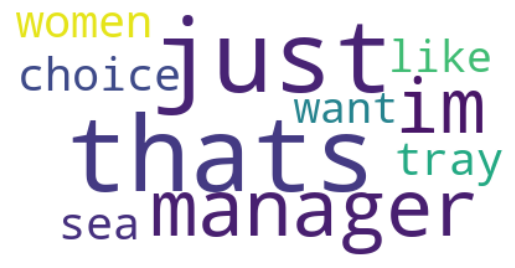

In [127]:
# Show wordcloud
create_wordcloud(topic_model_a, topic=1)

In [148]:
topic_model_a.visualize_barchart()

In [149]:
topic_model_a.visualize_term_rank()

In [158]:
from sentence_transformers import SentenceTransformer
from umap import UMAP

# Prepare embeddings
sentence_model = SentenceTransformer("all-MiniLM-L6-v2")
embeddings = sentence_model.encode(docs, show_progress_bar=False)

# Train BERTopic and extract hierarchical topics
topic_model = BERTopic(min_topic_size=2).fit(docs, embeddings)
hierarchical_topics = topic_model.hierarchical_topics(docs)



100%|████████████████████████████████████████████| 6/6 [00:00<00:00, 506.46it/s]


In [159]:
# Run the visualization with the original embeddings
topic_model.visualize_hierarchical_documents(docs, hierarchical_topics, embeddings=embeddings)

# Reduce dimensionality of embeddings, this step is optional but much faster to perform iteratively:
reduced_embeddings = UMAP(n_neighbors=10, n_components=2, min_dist=0.0, metric='cosine').fit_transform(embeddings)
topic_model.visualize_hierarchical_documents(docs, hierarchical_topics, reduced_embeddings=reduced_embeddings)

IndexError: index -1 is out of bounds for axis 0 with size 0

In [160]:
temp_roi = 'S3R'
docs = sig_window_stim_info[sig_window_stim_info['ROI'] == temp_roi]['Text'].to_list()

vectorizer_model = CountVectorizer(stop_words="english")
topic_model_b = BERTopic(vectorizer_model=vectorizer_model, min_topic_size=2)
topics, probs = topic_model_b.fit_transform(docs)
topic_model_b.get_topic_info()


,Topic,Count,Name,Representation,Representative_Docs
0,-1,9,-1_say_im_based_yeah,"[say, im, based, yeah, hmm, joe, gruff, guys, ...","[ The hell bedroom window? Sydney Opera?, He'..."
1,0,8,0_thats_just_little_im,"[thats, just, little, im, want, going, youre, ...",[ gonna flip it around in there get it evenly ...
2,1,7,1_tank_shark_think_investment,"[tank, shark, think, investment, fought, 80000...","[, an offer of $80,000 for 25% in the..., Th..."
3,2,7,2_sea_chicks_petrol_today,"[sea, chicks, petrol, today, sky, skills, resc...",[ necessary political skills to implement plan...
4,3,4,3_mended_scabby_runs_old,"[mended, scabby, runs, old, hearing, friends, ...","[ I do have one of my closest friends runs., ..."
5,4,4,4_seconds_said_right_question,"[seconds, said, right, question, 80, ago, stan...",[ That's what the question was in the beginnin...
6,5,2,5_began_people_morphine_deli,"[began, people, morphine, deli, changing, aski...","[ Then, as if from nowhere and a deli., this ..."
7,6,2,6_manager_speak_room_owner,"[manager, speak, room, owner, asked, want, , ,...","[ I asked for the room, What? I am the owner...."


In [161]:
topic_model_b.visualize_barchart()

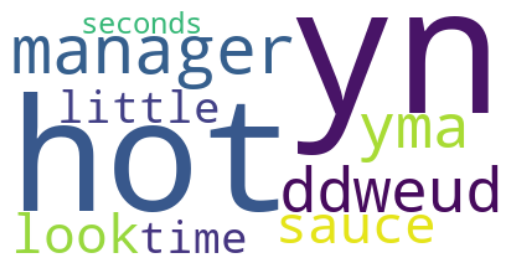

In [121]:
# Show wordcloud
create_wordcloud(topic_model, topic=-1)

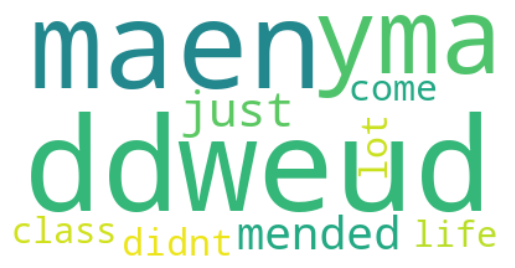

In [65]:
# Show wordcloud
create_wordcloud(topic_model, topic=0)

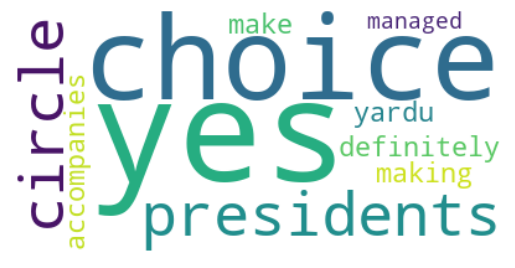

In [66]:
# Show wordcloud
create_wordcloud(topic_model, topic=1)

In [67]:
from sklearn.metrics.pairwise import cosine_similarity
sim_matrix = cosine_similarity(topic_model_S1R.topic_embeddings_, topic_model_S3R.topic_embeddings_)
sim_matrix

array([[0.7000484 ],
       [0.841606  ],
       [0.49389502]], dtype=float32)

In [82]:
vectorizer_model = CountVectorizer(stop_words="english")

topic_model_rois = dict()

for temp_roi in cb_roi_names:
    docs = sig_window_stim_info[sig_window_stim_info['ROI'] == temp_roi]['Text'].to_list()
    
    
    try:
        topic_model = BERTopic(vectorizer_model=vectorizer_model)
        topics, probs = topic_model.fit_transform(docs)
        
        topic_model_rois[temp_roi] = topic_model.topic_embeddings_

    except:
        topic_model_rois[temp_roi] = 'NA'

topic_model_rois

/opt/anaconda3/lib/python3.11/site-packages/umap/spectral.py:521: RuntimeWarning:

k >= N for N * N square matrix. Attempting to use scipy.linalg.eigh instead.

/opt/anaconda3/lib/python3.11/site-packages/umap/spectral.py:521: RuntimeWarning:

k >= N for N * N square matrix. Attempting to use scipy.linalg.eigh instead.

/opt/anaconda3/lib/python3.11/site-packages/umap/spectral.py:521: RuntimeWarning:

k >= N for N * N square matrix. Attempting to use scipy.linalg.eigh instead.

/opt/anaconda3/lib/python3.11/site-packages/umap/spectral.py:521: RuntimeWarning:

k >= N for N * N square matrix. Attempting to use scipy.linalg.eigh instead.

/opt/anaconda3/lib/python3.11/site-packages/umap/spectral.py:521: RuntimeWarning:

k >= N for N * N square matrix. Attempting to use scipy.linalg.eigh instead.

/opt/anaconda3/lib/python3.11/site-packages/umap/spectral.py:521: RuntimeWarning:

k >= N for N * N square matrix. Attempting to use scipy.linalg.eigh instead.



{'M1L': array([[ 0.00175443,  0.03160834,  0.02443231, ..., -0.01025067,
         -0.0039695 , -0.03976552],
        [ 0.00680227,  0.01229353,  0.01243286, ..., -0.00727635,
         -0.00917506,  0.00855039],
        [-0.1101833 ,  0.0450648 ,  0.00980762, ...,  0.09400262,
          0.02760832, -0.00965507]], dtype=float32),
 'M2L': array([[-4.17126492e-02,  3.51111330e-02,  3.33564058e-02,
          8.37866776e-03,  1.62940491e-02, -2.85465512e-02,
          6.86628148e-02, -7.34771881e-03, -1.65445898e-02,
         -2.27017496e-02, -6.97935838e-03, -4.72948374e-03,
         -6.68187672e-03,  3.73997400e-03,  3.28913215e-03,
         -7.38724833e-03, -1.51779025e-03, -1.66010708e-02,
         -4.68199439e-02,  2.28107180e-02, -2.89222393e-02,
          1.75097417e-02, -3.26872664e-03,  1.85062771e-03,
         -4.75095697e-02,  4.21794225e-03,  8.76638107e-03,
          2.66830972e-03, -8.69264535e-04, -3.84252146e-02,
          3.90867295e-04,  1.02478145e-02,  6.91680983e-03,
   

In [102]:
topic_model_sim = pd.DataFrame(columns=cb_roi_names, index=cb_roi_names)

for temp_roi_a in cb_roi_names:
    if topic_model_rois[temp_roi_a] == 'NA':
        topic_model_sim.loc[temp_roi_a] = 0
    else:
        for temp_roi_b in cb_roi_names:
            if topic_model_rois[temp_roi_b] == 'NA':
                topic_model_sim.loc[:,temp_roi_b] = 0
            else:
                sim_matrix = cosine_similarity(topic_model_rois[temp_roi_a], 
                                               topic_model_rois[temp_roi_b])

                topic_model_sim.loc[temp_roi_a, temp_roi_b] = sim_matrix.mean()

    topic_model_sim[temp_roi_a] = pd.to_numeric(topic_model_sim[temp_roi_a])


In [108]:
#topic_model_rois['A1L']
cosine_similarity(topic_model_rois['A1L'], 
                                               topic_model_rois['A1L'])

array([[1.0000001 , 0.3438915 , 0.41255343],
       [0.3438915 , 1.0000001 , 0.38048515],
       [0.41255343, 0.38048515, 0.9999997 ]], dtype=float32)

<Axes: >

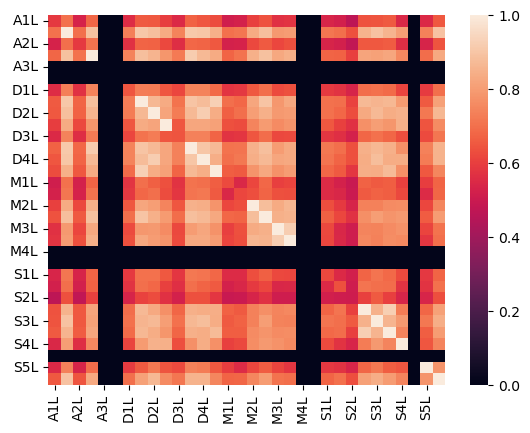

In [106]:
import seaborn as sns

sns.heatmap(topic_model_sim)

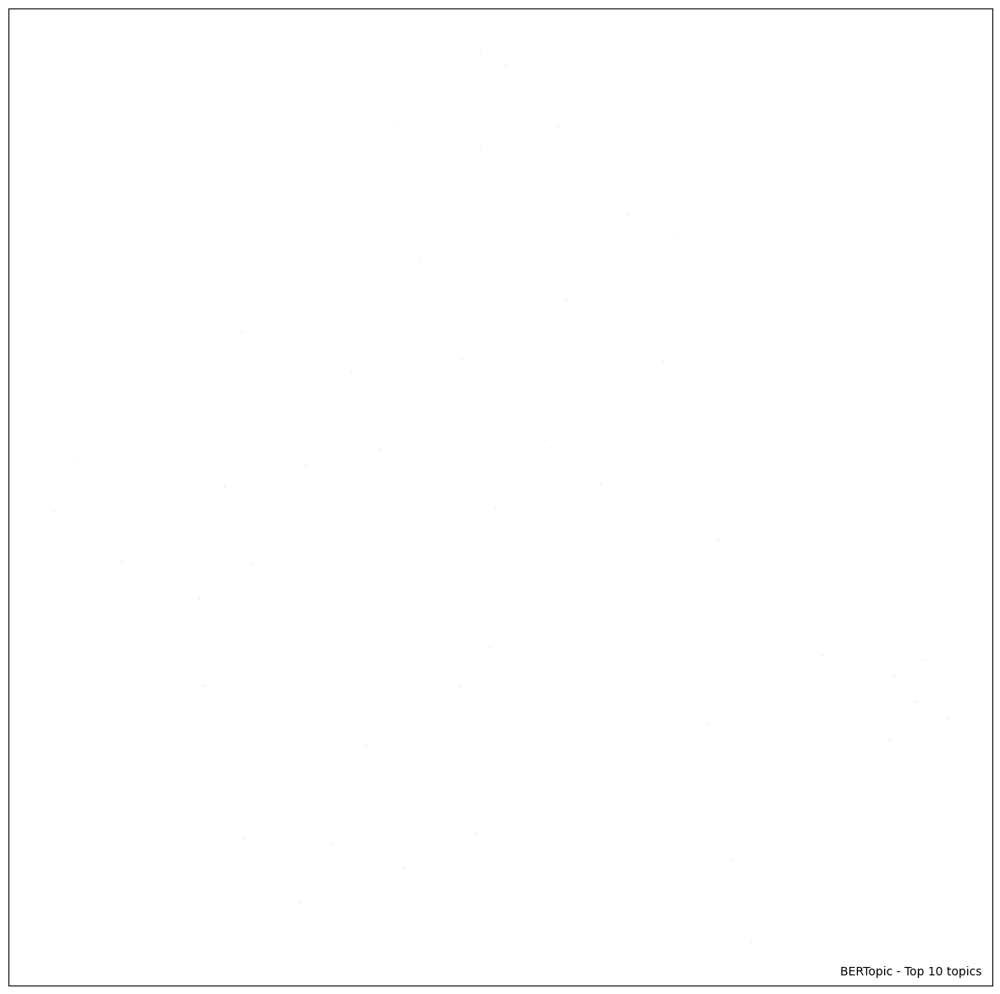

In [52]:
from umap import UMAP
 
import matplotlib
import matplotlib.pyplot as plt
  
# Prepare data for plotting
embeddings = topic_model._extract_embeddings(docs, method="document")
umap_model = UMAP(n_neighbors=10, n_components=2, min_dist=0.0, metric='cosine').fit(embeddings)
df = pd.DataFrame(umap_model.embedding_, columns=["x", "y"])
df["topic"] = topics
 
# Plot parameters
top_n = 10
fontsize = 12
 
# Slice data
to_plot = df.copy()
to_plot[df.topic >= top_n] = -1
outliers = to_plot.loc[to_plot.topic == -1]
non_outliers = to_plot.loc[to_plot.topic != -1]
 
# Visualize topics
cmap = matplotlib.colors.ListedColormap(['#FF5722', # Red
                                        '#03A9F4', # Blue
                                        '#4CAF50', # Green
                                        '#80CBC4', # FFEB3B
                                        '#673AB7', # Purple
                                        '#795548', # Brown
                                        '#E91E63', # Pink
                                        '#212121', # Black
                                        '#00BCD4', # Light Blue
                                        '#CDDC39', # Yellow/Red
                                        '#AED581', # Light Green
                                        '#FFE082', # Light Orange
                                        '#BCAAA4', # Light Brown
                                        '#B39DDB', # Light Purple
                                        '#F48FB1', # Light Pink
                                        ])
 
# Visualize outliers + inliers
fig, ax = plt.subplots(figsize=(15, 15))
scatter_outliers = ax.scatter(outliers['x'], outliers['y'], c="#E0E0E0", s=1, alpha=.3)
scatter = ax.scatter(non_outliers['x'], non_outliers['y'], c=non_outliers['topic'], s=10, alpha=.3, cmap=cmap)
 
# Add topic names to clusters
centroids = to_plot.groupby("topic").mean().reset_index().iloc[1:]
for row in centroids.iterrows():
   topic = int(row[1].topic)
   text = f"{topic}: " + "_".join([x[0] for x in topic_model.get_topic(topic)[:3]])
   ax.text(row[1].x, row[1].y*1.01, text, fontsize=fontsize, horizontalalignment='center')
 
ax.text(0.99, 0.01, f"BERTopic - Top {top_n} topics", transform=ax.transAxes, horizontalalignment="right", color="black")
plt.xticks([], [])
plt.yticks([], [])
#plt.savefig("BERTopic_Example_Cluster_Plot.png")
plt.show()

In [158]:
audio_clip

In [157]:
# Extract the audio segment from the video
#audio_segment = video_clip.subclip(current_time, current_time + remaining_duration)
audio_clip = video_clip.audio
audio_path = outp_dir+clip_name+'.wav'
audio_clip.write_audiofile(audio_path, codec='pcm_s16le')

AttributeError: 'NoneType' object has no attribute 'write_audiofile'

In [7]:
model = whisper.load_model("small")
result = model.transcribe(audio_path, word_timestamps=True)
print(result["text"])

 When you look at me, you probably see a guy who has it all. But really, there's a large part of me that's immature and underdeveloped, especially when it comes to women. Every girl I liked growing up rejected me, and because of that, I've grown into a man who is chronically nervous around women. I'm an emotional midget. Now, if someone came to me with this problem, I'd suggest immersion therapy, where you overwhelm yourself with your fear in order to overcome it. So tonight, to inspire you, I'm going to attempt to overcome my fear of the opposite sex by dating not one, but ten women at the same time. Wish me luck. I needed to get ten women to agree to date me, so I thought it'd be easy to start with someone I work with. So, you know how I'm doing the thing on the show where I'm dating, like, ten women at the same time? Yeah. You're in a relationship right now? Yes. Okay. So, sorry, never mind. That's a stupid task. It didn't work, and I knew from experience that women just wouldn't st

In [8]:
transcript_ts = pd.DataFrame(columns=['Text','Start_time','End_time'])

for idx in range(len(result['segments'])):
    transcript_ts.loc[idx, 'Text'] = result['segments'][idx]['text']
    transcript_ts.loc[idx, 'Start_time'] = result['segments'][idx]['start']
    transcript_ts.loc[idx, 'End_time'] = result['segments'][idx]['end']



In [9]:
transcript_ts

,Text,Start_time,End_time
0,"When you look at me, you probably see a guy w...",0.0,3.2
1,"But really, there's a large part of me that's...",3.8,8.32
2,especially when it comes to women.,8.38,10.4
3,"Every girl I liked growing up rejected me,",11.58,14.0
4,"and because of that, I've grown into a man wh...",14.34,18.5
...,...,...,...
64,Will they find love?,182.14,183.2
65,Will they find their soulmate?,183.74,185.18
66,I'm Anthony Napoli.,185.82,186.84
67,This is The Hunk.,187.3,188.66


# Sentiment Analysis

In [10]:
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

In [11]:
nltk.download('vader_lexicon')
nltk.download('punkt')
nltk.download('punkt_tab')
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/hpopal/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package punkt to /Users/hpopal/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     /Users/hpopal/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/hpopal/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /Users/hpopal/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [12]:
def preprocess(text):
    # Lowercase and then tokenize (split into words) the text
    tokens = word_tokenize(text.lower())

    # Remove stop words (common words with minimal content - mostly grammatical words)
    filtered_tokens = [token for token in tokens if token not in stopwords.words('english')]

    # Lemmatize the tokens (reduce words to base lemmas - i.e., form found in dictionary)
    lemmatizer = WordNetLemmatizer()
    lemmatized_tokens = [lemmatizer.lemmatize(token) for token in filtered_tokens]

    # Join the tokens back into a string
    processed_text = ' '.join(lemmatized_tokens)
    return processed_text

In [13]:
analyzer = SentimentIntensityAnalyzer()
def polarity(text):
    pol = analyzer.polarity_scores(text)
    return pol

In [159]:
cleaned_text = preprocess(transcript_ts.loc[0,'Text'])
cleaned_text

The history saving thread hit an unexpected error (OperationalError('attempt to write a readonly database')).History will not be written to the database.


'look , probably see guy .'

In [15]:
polarity(cleaned_text)

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}

In [16]:
for i_row in range(len(transcript_ts)):
    cleaned_text = preprocess(transcript_ts.loc[i_row,'Text'])
    transcript_ts.loc[i_row,'Text_clean'] = cleaned_text

    temp_sent = polarity(cleaned_text)
    transcript_ts.loc[i_row,'neg'] = temp_sent['neg']
    transcript_ts.loc[i_row,'neu'] = temp_sent['neu']
    transcript_ts.loc[i_row,'pos'] = temp_sent['pos']

In [17]:
transcript_ts.head()

,Text,Start_time,End_time,Text_clean,neg,neu,pos
0,"When you look at me, you probably see a guy w...",0.0,3.2,"look , probably see guy .",0.000,1.000,0.000
1,"But really, there's a large part of me that's...",3.8,8.32,"really , 's large part 's immature underdevelo...",0.000,1.000,0.000
2,especially when it comes to women.,8.38,10.4,especially come woman .,0.000,1.000,0.000
3,"Every girl I liked growing up rejected me,",11.58,14.0,"every girl liked growing rejected ,",0.337,0.204,0.459
4,"and because of that, I've grown into a man wh...",14.34,18.5,", 've grown man chronically nervous around wom...",0.259,0.741,0.000


# Create Regressors
Translate features of interest in to regressors with a value for each TR. This can be used to correlate with the reverse correlation significant activations output.

In [21]:
from nilearn.glm.first_level import compute_regressor
import numpy as np

In [22]:
tr = 1.25  # repetition time is 1 second
n_scans = 476  # the acquisition comprises 128 scans
frame_times = np.arange(n_scans) * tr 

In [23]:


# Make onsets like file
events = pd.DataFrame(columns=['trial_type', 'onset', 'duration'])

events['trial_type'] = transcript_ts['Text']
events['onset'] = pd.to_numeric(transcript_ts['Start_time'])
events['duration'] = pd.to_numeric(transcript_ts['End_time'] - transcript_ts['Start_time'])


# Make empty dataframe for feature regressors
features_df = pd.DataFrame(index = frame_times)

features = ['neg','neu','pos']

for feat in features:
    events[feat] = pd.to_numeric(transcript_ts[feat])

    temp_dm = events[['onset','duration',feat]].to_numpy()
    signal_feat, _labels = compute_regressor(temp_dm.T, 'spm', 
                                            frame_times, con_id=feat)

    features_df[feat] = signal_feat
    
features_df.head(20)

,neg,neu,pos
0.00,0.000000,0.000000,0.000000
1.25,0.000000,0.002107,0.000000
2.50,0.000000,0.049596,0.000000
3.75,0.000000,0.210905,0.000000
5.00,0.000000,0.448752,0.000000
6.25,0.000000,0.651059,0.000000
7.50,0.000000,0.796770,0.000000
8.75,0.000000,0.912842,0.000000
10.00,0.000000,1.003534,0.000000
11.25,0.000000,1.059920,0.000000


<Axes: >

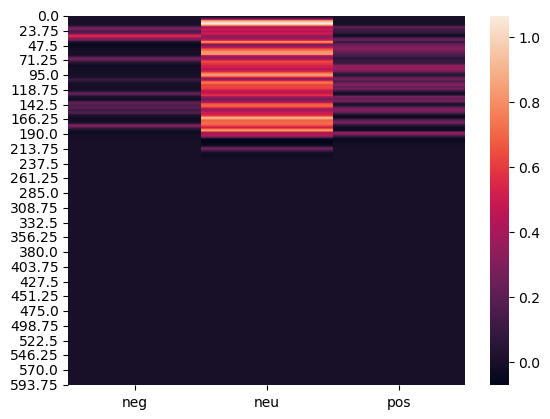

In [24]:
import seaborn as sns
sns.heatmap(features_df)

In [ ]:
# Create Time Series Regressors
from nilearn.glm.first_level import compute_regressor


# Set scan specific parameters
tr = args.TR
n_scans = args.Frames
frame_times = np.arange(n_scans) * tr 


# Make onsets like file
events = pd.DataFrame(columns=['trial_type', 'onset', 'duration'])

events['trial_type'] = transcript_ts['Text']
events['onset'] = pd.to_numeric(transcript_ts['Start_time'])
events['duration'] = pd.to_numeric(transcript_ts['End_time'] - transcript_ts['Start_time'])


# Make empty dataframe for feature regressors
features_df = pd.DataFrame(index = frame_times)

features = ['neg','neu','pos']

for feat in features:
    events[feat] = pd.to_numeric(transcript_ts[feat])

    temp_dm = events[['onset','duration',feat]].to_numpy()
    signal_feat, _labels = compute_regressor(temp_dm.T, 'spm', 
                                            frame_times, con_id=feat)

    features_df[feat] = signal_feat


# Export
features_df.to_csv(outp_dir+'annotations/'+clip_name+'_annotations-fmri.csv')

# Facial Expressions

In [67]:
from feat import Detector

#detector = Detector()

#detector

In [96]:
clip_name

'awkward_hd'

In [82]:
detector = Detector(face_model='retinaface', landmark_model='mobilefacenet', 
                    au_model='svm', emotion_model='resmasknet', facepose_model='img2pose')
Pair1_Q1_s1 = detector.detect_video(data_dir+clip_name+'.avi', skip_frames=30)


INFO:root:Loading Face model: retinaface
  pretrained_dict = torch.load(

INFO:root:Loading Facial Landmark model: mobilefacenet
  checkpoint = torch.load(

INFO:root:Loading facepose model: img2pose
  checkpoint = torch.load(model_path, map_location=self.device)

INFO:root:Loading AU model: svm
INFO:root:Loading emotion model: resmasknet
  torch.load(

INFO:root:Loading Identity model: facenet
  torch.load(

  0%|                                                                             | 0/6251 [00:00<?, ?it/s]INFO:root:VideoDataset: RESCALING WARNING: from (480, 854) to output_size=700
INFO:root:detecting faces...
INFO:root:detecting landmarks...
INFO:root:RESCALING WARNING: image_operations.extract_face_from_bbox() is rescaling cropped img with shape torch.Size([3, 94, 94]) to 112
INFO:root:detecting poses...
INFO:root:img2pose: RESCALING WARNING: img2pose has a min img size of 400 and a max img size of 1400 but checked value is torch.Size([393, 700]).
INFO:root:detecting aus...


KeyboardInterrupt: 

In [87]:
Pair1_Q1_s1 = Pair1_Q1_s1.reset_index(drop=True)
Pair1_Q1_s1

0         0
1        30
2        60
3        90
4       120
       ... 
281    6120
282    6150
283    6180
284    6210
285    6240
Name: frame, Length: 286, dtype: int64

In [130]:
emotions_df = Pair1_Q1_s1.emotions
emotions_df['frame'] = Pair1_Q1_s1['frame'].to_list()
emotions_df = emotions_df.groupby('frame').mean()
emotions_df = emotions_df.reset_index(drop=True)
emotions_df = emotions_df.reset_index(names=['TR'])
emotions_df.head()

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  emotions_df['frame'] = Pair1_Q1_s1['frame'].to_list()



,TR,anger,disgust,fear,happiness,sadness,surprise,neutral
0,0,0.523838,0.005422,0.000744,0.001147,0.028814,0.003860,0.436174
1,1,0.650072,0.001614,0.003041,0.008241,0.005349,0.160102,0.171581
2,2,0.533752,0.000127,0.012869,0.013256,0.001105,0.421653,0.017239
3,3,0.954813,0.009838,0.001204,0.001714,0.001255,0.014287,0.016889
4,4,0.050837,0.009303,0.000274,0.006155,0.040199,0.008456,0.884776


In [111]:
Pair1_Q1_s1[Pair1_Q1_s1['frame'].isin(Pair1_Q1_s1['frame'][Pair1_Q1_s1['frame'].duplicated()])].sort_values("frame")

,FaceRectX,FaceRectY,FaceRectWidth,FaceRectHeight,FaceScore,x_0,x_1,x_2,x_3,x_4,...,Identity_506,Identity_507,Identity_508,Identity_509,Identity_510,Identity_511,Identity_512,input,frame,approx_time
5,447.692408,64.664089,77.191368,107.920400,0.998828,449.988557,449.224375,449.221704,449.711628,451.575551,...,0.036616,0.078287,-0.010244,0.026761,0.088249,-0.041574,-0.010717,/Users/hpopal/Google Drive/My Drive/dscn_lab/p...,150,00:05
6,3.748773,219.564382,19.514362,25.271544,0.808828,7.411849,7.028259,6.745092,6.683473,7.068922,...,0.018104,0.015412,0.006812,-0.001873,-0.016877,0.007115,-0.024580,/Users/hpopal/Google Drive/My Drive/dscn_lab/p...,150,00:05
36,457.790941,69.413429,93.869729,129.973671,0.993427,458.061479,458.357578,459.702929,461.765079,465.284619,...,0.057754,0.095371,-0.024620,0.015271,0.092067,-0.028009,-0.024832,/Users/hpopal/Google Drive/My Drive/dscn_lab/p...,1050,00:35
37,803.962065,127.014300,44.767706,57.767932,0.768863,803.084174,805.574838,808.306177,811.927527,816.901013,...,0.042164,0.010543,-0.003585,0.017855,0.018156,0.030247,-0.031249,/Users/hpopal/Google Drive/My Drive/dscn_lab/p...,1050,00:35
38,397.757727,52.063360,96.712246,140.862205,0.993708,397.314217,398.478785,400.630650,403.775405,408.630043,...,0.021586,0.092451,0.000918,0.038088,0.101603,-0.000880,-0.024197,/Users/hpopal/Google Drive/My Drive/dscn_lab/p...,1080,00:36
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
247,270.471939,72.700984,71.676617,84.707101,0.835024,271.820545,272.608500,274.215789,277.369488,282.868958,...,0.062442,0.042991,0.028393,0.008344,-0.013467,-0.019513,-0.022731,/Users/hpopal/Google Drive/My Drive/dscn_lab/p...,5160,02:52
258,398.323498,47.964682,48.022042,62.798916,0.993586,403.197521,403.367342,403.971484,405.234291,407.276846,...,-0.019138,0.033738,-0.072243,0.027850,0.028194,0.011897,-0.040091,/Users/hpopal/Google Drive/My Drive/dscn_lab/p...,5490,03:03
259,746.220318,69.959180,43.756592,51.499219,0.777867,745.201521,745.473302,746.180952,747.739725,750.143223,...,0.098497,0.048315,0.018049,-0.003662,-0.030893,0.002319,-0.034782,/Users/hpopal/Google Drive/My Drive/dscn_lab/p...,5490,03:03
260,357.633038,89.041599,38.944073,51.613657,0.998396,358.858541,360.173875,361.960979,364.291032,367.481648,...,0.026606,0.081175,-0.022029,0.032703,0.047617,-0.043200,-0.046456,/Users/hpopal/Google Drive/My Drive/dscn_lab/p...,5520,03:04


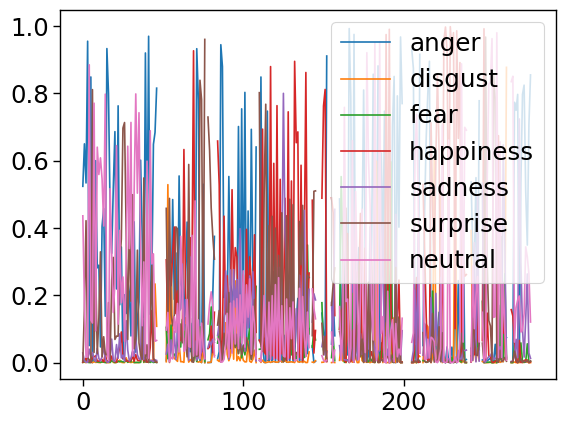

In [93]:
Q1_s1_emotions = Pair1_Q1_s1.emotions.plot()

In [115]:
test = Pair1_Q1_s1.extract_mean().aus
test

,mean_AU01,mean_AU02,mean_AU04,mean_AU05,mean_AU06,mean_AU07,mean_AU09,mean_AU10,mean_AU11,mean_AU12,mean_AU14,mean_AU15,mean_AU17,mean_AU20,mean_AU23,mean_AU24,mean_AU25,mean_AU26,mean_AU28,mean_AU43
0,0.429688,0.335938,0.417969,0.550781,0.039062,0.113281,0.230469,0.054688,0.179688,0.082031,0.574219,0.496094,0.210938,0.042969,0.570312,0.433594,0.433594,0.269531,0.496094,0.5


In [91]:
from feat.plotting import plot_face

plot_face(
    au=Pair1_Q1_s1, # the LDA coefs from the AUs pipeline model
    feature_range=(0, 1),
    muscles={"all": "heatmap"},
    title="Expression reconstructed from\nAU classifier weights",
    title_kwargs={'wrap':False}
);
sns.despine(left=True,bottom=True);

      FaceRectX   FaceRectY  FaceRectWidth  FaceRectHeight  FaceScore  \
0    476.320931   52.803836      69.003553       95.674585   0.998044   
1    433.270169   50.636216      72.223306       97.582028   0.998007   
2    452.980808   48.061316      71.230131      100.301827   0.998042   
3    424.265213   50.805748      73.555950      101.083048   0.999071   
4    396.072615   62.777371      76.834557      104.863031   0.998382   
..          ...         ...            ...             ...        ...   
281  522.578051  121.089601     120.380001      156.916117   0.998774   
282         NaN         NaN            NaN             NaN        NaN   
283         NaN         NaN            NaN             NaN        NaN   
284         NaN         NaN            NaN             NaN        NaN   
285         NaN         NaN            NaN             NaN        NaN   

            x_0         x_1         x_2         x_3         x_4  ...  \
0    476.563368  477.991824  480.161902  483.021475

ValueError: au vector must be length 20.

In [53]:
video_prediction = detector.detect_video(
    data_dir+clip_name+'.avi', data_type="video", skip_frames=30, face_detection_threshold=0.95
)


  0%|                                                                              | 0/209 [00:00<?, ?it/s]INFO:root:VideoDataset: RESCALING WARNING: from (480, 854) to output_size=700
INFO:root:detecting faces...
INFO:root:detecting landmarks...
INFO:root:RESCALING WARNING: image_operations.extract_face_from_bbox() is rescaling cropped img with shape torch.Size([3, 94, 94]) to 112
INFO:root:detecting poses...
INFO:root:img2pose: RESCALING WARNING: img2pose has a min img size of 400 and a max img size of 1400 but checked value is torch.Size([393, 700]).
INFO:root:detecting aus...
INFO:root:detecting emotions...
INFO:root:detecting identity...
INFO:root:RESCALING WARNING: image_operations.extract_face_from_bbox() is rescaling cropped img with shape torch.Size([3, 94, 94]) to 112
INFO:root:inverting face transform...
INFO:root:inverting landmark transform...
INFO:root:creating fex output...
  0%|▎                                                                     | 1/209 [00:01<05:44,  

NameError: name 'Pair1_Q1_s1' is not defined

In [73]:
video_prediction.query

,anger,disgust,fear,happiness,sadness,surprise,neutral
frame,,,,,,,
0,0.523838,0.005422,0.000744,0.001147,0.028814,0.003860,0.436174
30,0.650072,0.001614,0.003041,0.008241,0.005349,0.160102,0.171581
60,0.533752,0.000127,0.012869,0.013256,0.001105,0.421653,0.017239
90,0.954813,0.009838,0.001204,0.001714,0.001255,0.014287,0.016889
120,0.050837,0.009303,0.000274,0.006155,0.040199,0.008456,0.884776
...,...,...,...,...,...,...,...
6120,0.201273,0.000131,0.004291,0.007603,0.011428,0.068011,0.707264
6150,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6180,NaN,NaN,NaN,NaN,NaN,NaN,NaN


AttributeError: module 'av' has no attribute 'AVError'

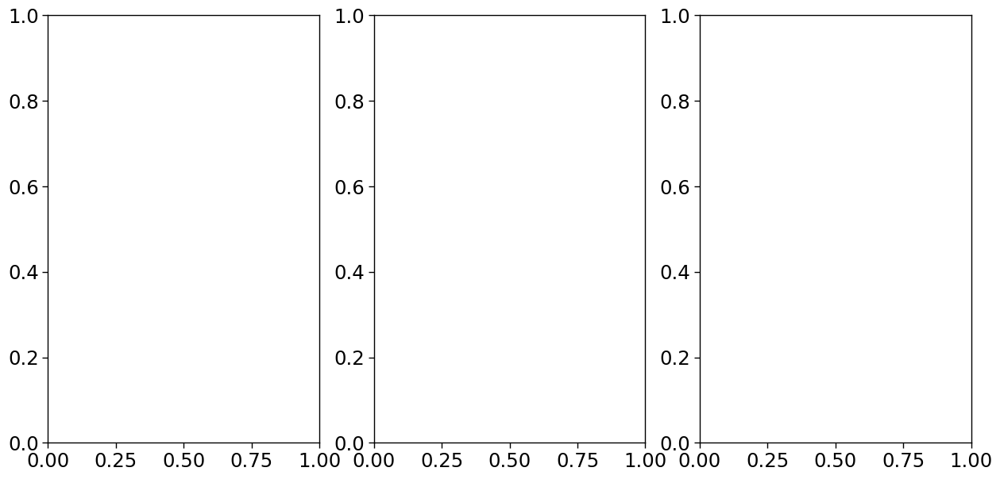

In [92]:
figs = Pair1_Q1_s1.plot_detections(poses=True)

AttributeError: module 'av' has no attribute 'AVError'

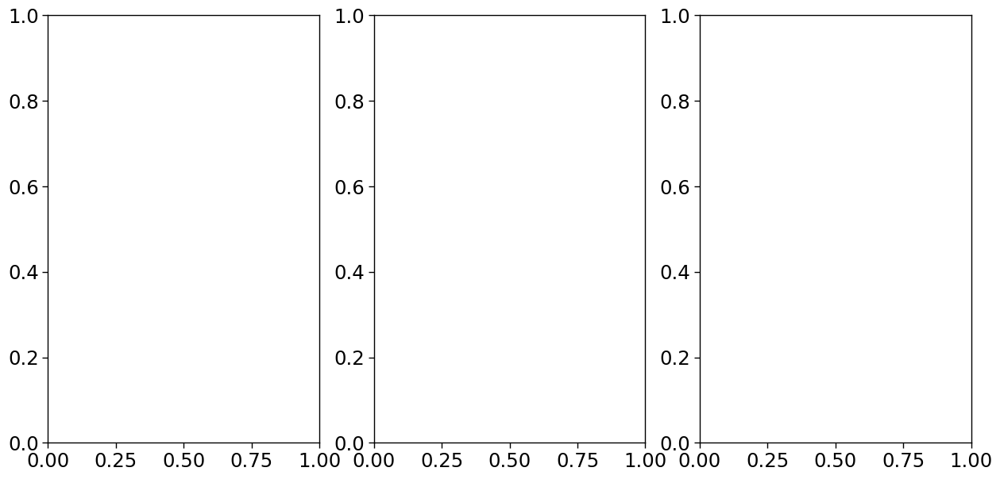

In [114]:
Pair1_Q1_s1.query("frame in [30]").plot_detections(
    faceboxes=True, add_titles=False
)

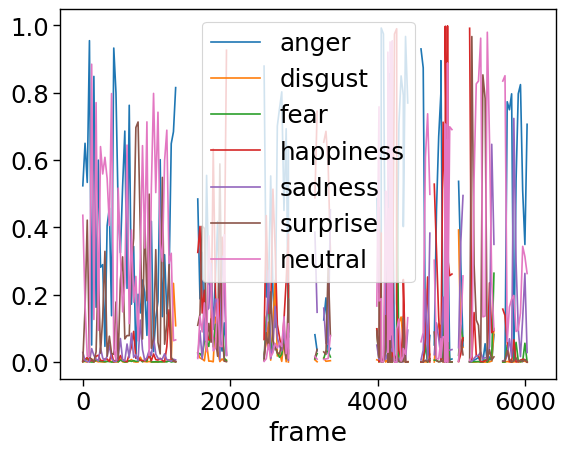

In [45]:
axes = video_prediction.emotions.plot()

# Topic Modeling

In [161]:
import re

# Preprocess the text data
def preprocess_text(text):
    text = re.sub('\s+', ' ', text)  # Remove extra spaces
    text = re.sub('\S*@\S*\s?', '', text)  # Remove emails
    text = re.sub('\'', '', text)  # Remove apostrophes
    text = re.sub('[^a-zA-Z]', ' ', text)  # Remove non-alphabet characters
    text = text.lower()  # Convert to lowercase
    return text

transcript_ts['Text_cleaned'] = transcript_ts['Text'].apply(preprocess_text)
transcript_ts['Text_cleaned'].head()

0     when you look at me  you probably see a guy w...
1     but really  theres a large part of me thats i...
2                   especially when it comes to women 
3           every girl i liked growing up rejected me 
4     and because of that  ive grown into a man who...
Name: Text_cleaned, dtype: object

In [162]:
import gensim
import nltk
from nltk.corpus import stopwords

# Download NLTK stopwords
nltk.download('stopwords')
stop_words = stopwords.words('english')

# Tokenize and remove stopwords
def tokenize(text):
    tokens = gensim.utils.simple_preprocess(text, deacc=True)
    tokens = [token for token in tokens if token not in stop_words]
    return tokens

transcript_ts['tokens'] = transcript_ts['Text_cleaned'].apply(tokenize)
transcript_ts['tokens'].head()

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/hpopal/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


0                           [look, probably, see, guy]
1    [really, theres, large, part, thats, immature,...
2                           [especially, comes, women]
3              [every, girl, liked, growing, rejected]
4    [ive, grown, man, chronically, nervous, around...
Name: tokens, dtype: object

In [163]:
import spacy

# Load spaCy model
nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner'])

def lemmatize(tokens):
    doc = nlp(" ".join(tokens))
    return [token.lemma_ for token in doc]

transcript_ts['lemmas'] = transcript_ts['tokens'].apply(lemmatize)
transcript_ts['lemmas'].head()

0                           [look, probably, see, guy]
1    [really, there, s, large, part, that, s, immat...
2                            [especially, come, woman]
3                    [every, girl, like, grow, reject]
4    [I, ve, grow, man, chronically, nervous, aroun...
Name: lemmas, dtype: object

In [164]:
import gensim.corpora as corpora

# Create dictionary and corpus
id2word = corpora.Dictionary(transcript_ts['lemmas'])
texts = transcript_ts['lemmas']
corpus = [id2word.doc2bow(text) for text in texts]

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary<0 unique tokens: []>
INFO:gensim.corpora.dictionary:built Dictionary<175 unique tokens: ['guy', 'look', 'probably', 'see', 'immature']...> from 69 documents (total 313 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary<175 unique tokens: ['guy', 'look', 'probably', 'see', 'immature']...> from 69 documents (total 313 corpus positions)", 'datetime': '2025-04-16T15:16:09.837382', 'gensim': '4.3.3', 'python': '3.11.5 | packaged by conda-forge | (main, Aug 27 2023, 03:33:12) [Clang 15.0.7 ]', 'platform': 'macOS-14.6.1-arm64-arm-64bit', 'event': 'created'}


In [165]:
# Build LDA model
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                            id2word=id2word,
                                            num_topics=3, 
                                            random_state=100,
                                            update_every=1,
                                            chunksize=100,
                                            passes=10,
                                            alpha='auto',
                                            per_word_topics=True)

INFO:gensim.models.ldamodel:using autotuned alpha, starting with [0.33333334, 0.33333334, 0.33333334]
INFO:gensim.models.ldamodel:using symmetric eta at 0.3333333333333333
INFO:gensim.models.ldamodel:using serial LDA version on this node
INFO:gensim.models.ldamodel:running online (multi-pass) LDA training, 3 topics, 10 passes over the supplied corpus of 69 documents, updating model once every 69 documents, evaluating perplexity every 69 documents, iterating 50x with a convergence threshold of 0.001000
INFO:gensim.models.ldamodel:-6.650 per-word bound, 100.4 perplexity estimate based on a held-out corpus of 69 documents with 313 words
INFO:gensim.models.ldamodel:PROGRESS: pass 0, at document #69/69
INFO:gensim.models.ldamodel:optimized alpha [0.3450989, 0.31874168, 0.34818256]
INFO:gensim.models.ldamodel:topic #0 (0.345): 0.037*"I" + 0.036*"m" + 0.031*"one" + 0.028*"woman" + 0.018*"come" + 0.016*"would" + 0.014*"date" + 0.014*"try" + 0.014*"smoothie" + 0.013*"not"
INFO:gensim.models.lda

In [166]:
# Print the topics
topics = lda_model.print_topics(num_words=10)
for topic in topics:
    print(topic)

INFO:gensim.models.ldamodel:topic #0 (0.165): 0.051*"m" + 0.051*"I" + 0.030*"woman" + 0.028*"one" + 0.019*"come" + 0.018*"date" + 0.018*"okay" + 0.014*"show" + 0.013*"anthony" + 0.013*"napoli"
INFO:gensim.models.ldamodel:topic #1 (0.150): 0.051*"smoothie" + 0.042*"like" + 0.023*"I" + 0.023*"find" + 0.017*"tray" + 0.017*"not" + 0.016*"m" + 0.016*"grow" + 0.016*"new" + 0.016*"raspberry"
INFO:gensim.models.ldamodel:topic #2 (0.168): 0.038*"woman" + 0.032*"need" + 0.026*"would" + 0.020*"move" + 0.020*"way" + 0.020*"hunk" + 0.020*"that" + 0.020*"s" + 0.019*"man" + 0.016*"like"


(0, '0.051*"m" + 0.051*"I" + 0.030*"woman" + 0.028*"one" + 0.019*"come" + 0.018*"date" + 0.018*"okay" + 0.014*"show" + 0.013*"anthony" + 0.013*"napoli"')
(1, '0.051*"smoothie" + 0.042*"like" + 0.023*"I" + 0.023*"find" + 0.017*"tray" + 0.017*"not" + 0.016*"m" + 0.016*"grow" + 0.016*"new" + 0.016*"raspberry"')
(2, '0.038*"woman" + 0.032*"need" + 0.026*"would" + 0.020*"move" + 0.020*"way" + 0.020*"hunk" + 0.020*"that" + 0.020*"s" + 0.019*"man" + 0.016*"like"')


In [176]:
topics

[(0,
  '0.051*"m" + 0.051*"I" + 0.030*"woman" + 0.028*"one" + 0.019*"come" + 0.018*"date" + 0.018*"okay" + 0.014*"show" + 0.013*"anthony" + 0.013*"napoli"'),
 (1,
  '0.051*"smoothie" + 0.042*"like" + 0.023*"I" + 0.023*"find" + 0.017*"tray" + 0.017*"not" + 0.016*"m" + 0.016*"grow" + 0.016*"new" + 0.016*"raspberry"'),
 (2,
  '0.038*"woman" + 0.032*"need" + 0.026*"would" + 0.020*"move" + 0.020*"way" + 0.020*"hunk" + 0.020*"that" + 0.020*"s" + 0.019*"man" + 0.016*"like"')]

In [252]:
# import the necessary libraries
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import NMF
from nltk import sent_tokenize, word_tokenize

import matplotlib.pyplot as plt

In [247]:
n_samples = 2000
n_features = 1000
n_components = 10
n_top_words = 20
batch_size = 128
init = "nndsvda"

In [250]:
def plot_top_words(model, feature_names, n_top_words, title):
    fig, axes = plt.subplots(2, 5, figsize=(30, 15), sharex=True)
    axes = axes.flatten()
    for topic_idx, topic in enumerate(model.components_):
        top_features_ind = topic.argsort()[-n_top_words:]
        top_features = feature_names[top_features_ind]
        weights = topic[top_features_ind]

        ax = axes[topic_idx]
        ax.barh(top_features, weights, height=0.7)
        ax.set_title(f"Topic {topic_idx +1}", fontdict={"fontsize": 30})
        ax.tick_params(axis="both", which="major", labelsize=20)
        for i in "top right left".split():
            ax.spines[i].set_visible(False)
        fig.suptitle(title, fontsize=40)

    plt.subplots_adjust(top=0.90, bottom=0.05, wspace=0.90, hspace=0.3)
    plt.show()

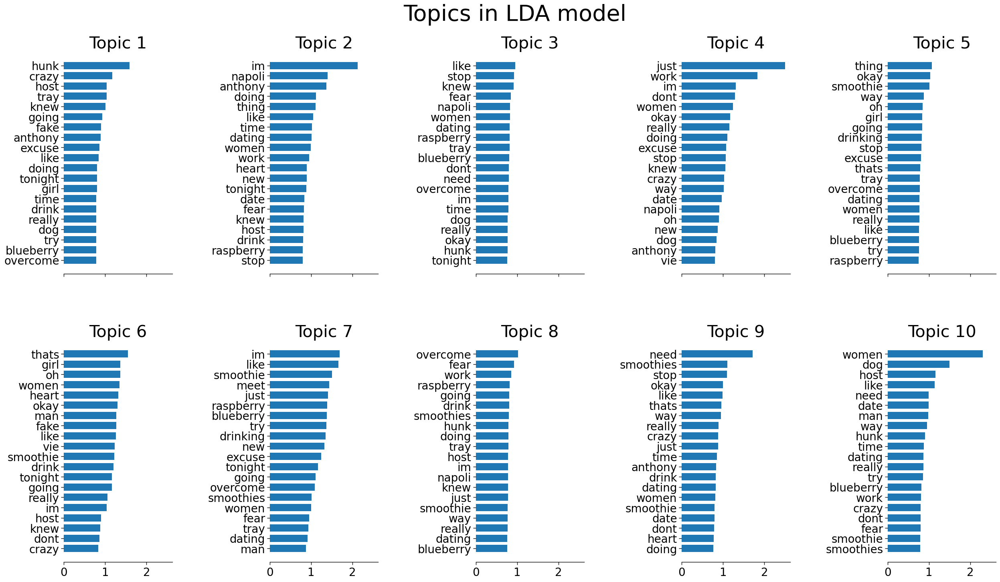

In [257]:
tf_vectorizer = CountVectorizer(
    max_df=0.95, min_df=2, max_features=n_features, stop_words="english"
)

tf = tf_vectorizer.fit_transform(transcript_ts["Text_cleaned"])

lda = LatentDirichletAllocation(
    n_components=n_components,
    max_iter=5,
    learning_method="online",
    learning_offset=50.0,
    random_state=0,
)
lda.fit(tf)

tf_feature_names = tf_vectorizer.get_feature_names_out()
plot_top_words(lda, tf_feature_names, n_top_words, "Topics in LDA model")

In [243]:
tfidf_vectorizer = TfidfVectorizer(
    max_df=0.95, min_df=2, max_features=1000, stop_words="english"
)
tfidf = tfidf_vectorizer.fit_transform(transcript_ts["Text_cleaned"])


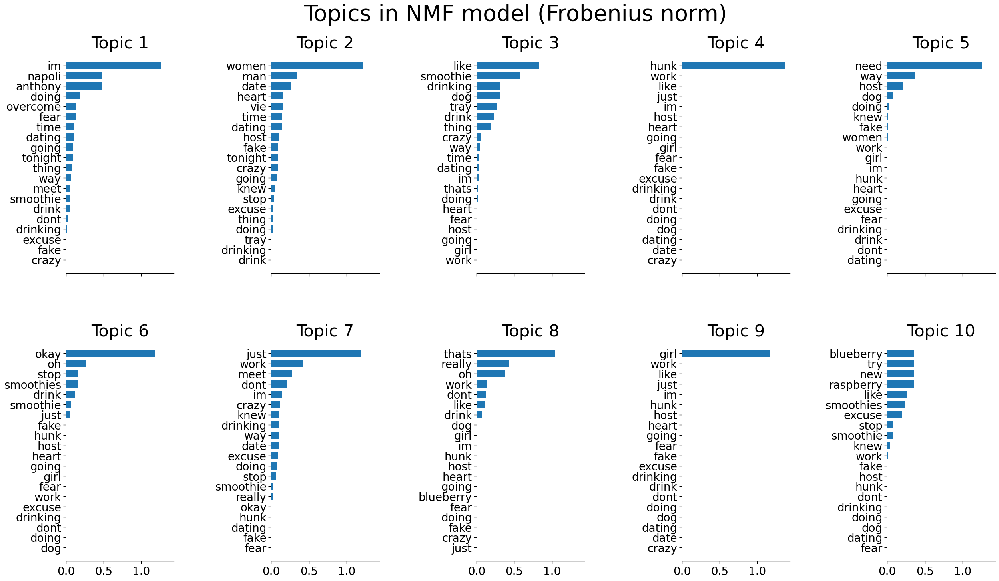

In [253]:
nmf = NMF(
    n_components=n_components,
    random_state=1,
    init=init,
    beta_loss="frobenius",
    alpha_W=0.00005,
    alpha_H=0.00005,
    l1_ratio=1,
).fit(tfidf)


tfidf_feature_names = tfidf_vectorizer.get_feature_names_out()
plot_top_words(
    nmf, tfidf_feature_names, n_top_words, "Topics in NMF model (Frobenius norm)"
)

In [238]:
# convert article to documents
document = sent_tokenize(result["text"])

# Create a TF-IDF vectorizer
tfidf_vectorizer = TfidfVectorizer(stop_words='english').fit_transform(document)

# Apply NMF
num_topics = 5  # Set the number of topics you want to identify
nmf_model = NMF(n_components=num_topics, init='random', random_state=42)
nmf_matrix = nmf_model.fit_transform(tfidf_vectorizer)

In [ ]:
tfidf_feature_names = tfidf_vectorizer.get_feature_names_out()
plot_top_words(
    nmf,
    tfidf_feature_names,
    n_top_words,
    "Topics in NMF model (generalized Kullback-Leibler divergence)",
)

In [239]:
nmf_matrix

array([[0.00000000e+00, 1.65734153e-18, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00],
       [1.79970448e-02, 1.98820965e-02, 7.55872637e-07, 0.00000000e+00,
        5.39417403e-03],
       [9.08387143e-03, 2.25143028e-02, 4.09035801e-07, 0.00000000e+00,
        5.72266551e-03],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 2.42709544e-14,
        0.00000000e+00],
       [0.00000000e+00, 2.96545656e-03, 9.50107282e-08, 0.00000000e+00,
        2.59137718e-03],
       [2.09018688e-03, 2.59364842e-02, 5.02881391e-07, 0.00000000e+00,
        2.86139614e-02],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 1.78197818e-14,
        0.00000000e+00],
       [4.47097741e-02, 2.21327086e-02, 1.12780276e-06, 0.00000000e+00,
        3.13658541e-03],
       [0.00000000e+00, 2.64223294e-02, 3.45808424e-07, 0.00000000e+00,
        1.85299312e-01],
       [0.00000000e+00, 0.00000000e+00, 2.86503329e-18, 0.00000000e+00,
        0.00000000e+00],
       [0.00000000e+00, 0.0000

In [187]:
transcript_ts

,Text,Start_time,End_time,Text_clean,neg,neu,pos,Text_cleaned,tokens,lemmas
0,"When you look at me, you probably see a guy w...",0.0,3.2,"look , probably see guy .",0.000,1.000,0.000,when you look at me you probably see a guy w...,"[look, probably, see, guy]","[look, probably, see, guy]"
1,"But really, there's a large part of me that's...",3.8,8.32,"really , 's large part 's immature underdevelo...",0.000,1.000,0.000,but really theres a large part of me thats i...,"[really, theres, large, part, thats, immature,...","[really, there, s, large, part, that, s, immat..."
2,especially when it comes to women.,8.38,10.4,especially come woman .,0.000,1.000,0.000,especially when it comes to women,"[especially, comes, women]","[especially, come, woman]"
3,"Every girl I liked growing up rejected me,",11.58,14.0,"every girl liked growing rejected ,",0.337,0.204,0.459,every girl i liked growing up rejected me,"[every, girl, liked, growing, rejected]","[every, girl, like, grow, reject]"
4,"and because of that, I've grown into a man wh...",14.34,18.5,", 've grown man chronically nervous around wom...",0.259,0.741,0.000,and because of that ive grown into a man who...,"[ive, grown, man, chronically, nervous, around...","[I, ve, grow, man, chronically, nervous, aroun..."
...,...,...,...,...,...,...,...,...,...,...
64,Will they find love?,182.14,183.2,find love ?,0.000,0.192,0.808,will they find love,"[find, love]","[find, love]"
65,Will they find their soulmate?,183.74,185.18,find soulmate ?,0.000,0.204,0.796,will they find their soulmate,"[find, soulmate]","[find, soulmate]"
66,I'm Anthony Napoli.,185.82,186.84,'m anthony napoli .,0.000,1.000,0.000,im anthony napoli,"[im, anthony, napoli]","[I, m, anthony, napoli]"
67,This is The Hunk.,187.3,188.66,hunk .,0.000,1.000,0.000,this is the hunk,[hunk],[hunk]


In [189]:
'\w+|\$[\d\.]+|\S+'



  '\w+|\$[\d\.]+|\S+'



'\\w+|\\$[\\d\\.]+|\\S+'

In [216]:
from sklearn.feature_extraction.text import CountVectorizer

# the vectorizer object will be used to transform text to vector form
vectorizer = CountVectorizer(max_df=0.9, min_df=5)

# apply transformation
tf = vectorizer.fit_transform(transcript_ts['Text_cleaned']).toarray()

# tf_feature_names tells us what word each column in the matric represents
tf_feature_names = vectorizer.get_feature_names_out()

In [217]:
tf_feature_names

array(['and', 'but', 'im', 'it', 'just', 'like', 'me', 'my', 'of', 'okay',
       'one', 'smoothie', 'so', 'that', 'the', 'this', 'to', 'was',
       'women', 'would', 'you'], dtype=object)

In [218]:
from sklearn.decomposition import LatentDirichletAllocation

number_of_topics = 10

model = LatentDirichletAllocation(n_components=number_of_topics, random_state=0)

In [219]:
model.fit(tf)

LatentDirichletAllocation(random_state=0)

In [220]:
def display_topics(model, feature_names, no_top_words):
    topic_dict = {}
    for topic_idx, topic in enumerate(model.components_):
        topic_dict["Topic %d words" % (topic_idx)]= ['{}'.format(feature_names[i])
                        for i in topic.argsort()[:-no_top_words - 1:-1]]
        topic_dict["Topic %d weights" % (topic_idx)]= ['{:.1f}'.format(topic[i])
                        for i in topic.argsort()[:-no_top_words - 1:-1]]
    return pd.DataFrame(topic_dict)

In [221]:
no_top_words = 10
display_topics(model, tf_feature_names, no_top_words)

,Topic 0 words,Topic 0 weights,Topic 1 words,Topic 1 weights,Topic 2 words,Topic 2 weights,Topic 3 words,Topic 3 weights,Topic 4 words,Topic 4 weights,Topic 5 words,Topic 5 weights,Topic 6 words,Topic 6 weights,Topic 7 words,Topic 7 weights,Topic 8 words,Topic 8 weights,Topic 9 words,Topic 9 weights
0,to,6.1,so,3.1,it,3.6,to,12.7,my,8.8,okay,5.1,the,7.1,im,11.1,this,0.1,this,0.1
1,the,5.1,one,2.1,just,3.1,you,8.5,like,5.1,you,2.7,and,2.1,to,5.8,to,0.1,to,0.1
2,was,5.1,to,0.1,me,2.2,me,8.0,smoothie,3.9,like,2.1,but,2.1,the,5.1,you,0.1,you,0.1
3,women,4.1,but,0.1,to,2.2,and,4.1,that,3.1,would,2.1,it,2.1,just,4.1,it,0.1,it,0.1
4,it,3.1,women,0.1,but,2.1,this,3.1,you,2.1,one,2.1,women,2.1,my,2.3,me,0.1,me,0.1
5,one,3.1,the,0.1,was,2.1,that,3.1,to,1.2,to,1.6,would,2.1,you,2.1,of,0.1,of,0.1
6,my,2.2,this,0.1,women,1.3,of,3.1,of,1.1,smoothie,1.3,this,1.1,so,2.1,but,0.1,but,0.1
7,of,2.1,you,0.1,would,1.1,women,2.9,but,1.1,me,1.1,one,0.1,and,2.1,women,0.1,women,0.1
8,this,1.1,it,0.1,the,1.1,it,2.6,just,0.1,just,1.1,to,0.1,this,1.1,and,0.1,and,0.1
9,and,1.1,me,0.1,and,0.1,but,1.1,was,0.1,of,0.1,you,0.1,of,1.1,just,0.1,just,0.1


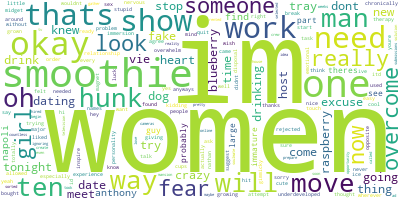

In [223]:
# Import the wordcloud library
from wordcloud import WordCloud

# Join the different processed titles together.
long_string = ','.join(list(transcript_ts['Text_cleaned'].values))

# Create a WordCloud object
wordcloud = WordCloud(background_color="white", max_words=5000, contour_width=3, contour_color='steelblue')

# Generate a word cloud
wordcloud.generate(long_string)

# Visualize the word cloud
wordcloud.to_image()

In [225]:

import pyLDAvis

In [227]:
LDAvis_prepared = pyLDAvis.prepare(lda_model, corpus, id2word)

TypeError: prepare() missing 2 required positional arguments: 'vocab' and 'term_frequency'

In [ ]:
pyLDAvis.display(movies_vis_data)